# Install

In [1]:
#!pip install xlrd

In [2]:
#!pip uninstall scikit-learn -y
#!pip install scikit-learn==1.5.2

In [3]:
#!pip install darts

In [4]:
#!pip install optuna

In [5]:
#!pip install folium==0.19.3

In [6]:
#!pip install plotly==5.24.1

# Imports

In [7]:
import darts
import sklearn
import scipy
import optuna
print(darts.__version__)
print(sklearn.__version__)
print(scipy.__version__)
print(optuna.__version__)

0.32.0
1.5.2
1.15.1
4.2.0


In [8]:


import warnings

warnings.filterwarnings("ignore")


In [9]:
# Files
import glob
import pickle
import json
import shutil
import os
import yaml

# Console
import argparse

# Utils
import random
import time
from datetime import datetime
from itertools import product

# Padans
import pandas as pd
import numpy as np

# Track
from tqdm.auto import tqdm

# Typing
from typing import Any, Dict, Optional, Callable

# Logging
import logging

In [10]:
# Plot
%matplotlib inline
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import seaborn as sns
sns.set_theme(style="whitegrid")
# Mapa
import folium
#import webbrowser

In [11]:
from scipy.stats import boxcox

In [12]:

# Scikit-learn
from sklearn.preprocessing import MaxAbsScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import TimeSeriesSplit

In [13]:
# Statmodels
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
from statsmodels.tsa.filters.hp_filter import hpfilter

In [14]:
import tensorflow as tf
print(tf.__version__)
import tensorboard
print(tensorboard.__version__)
# Pytorch
import torch
print(torch.__version__)
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

2025-02-03 18:48:34.653912: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738608514.679855   72293 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738608514.687951   72293 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-03 18:48:34.708097: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2.18.0
2.18.0
2.5.1+cu124


In [15]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [16]:
# Darts

from darts import TimeSeries
from darts.utils.missing_values import fill_missing_values
from darts.utils.callbacks import TFMProgressBar
from darts.utils.losses import SmapeLoss
from darts import concatenate
# Utils
from darts.utils.timeseries_generation import (
    datetime_attribute_timeseries,
    sine_timeseries,
)
# Metrics
from darts.metrics import (
    smape,
    mape,
    rmse,
    mae,
    r2_score
)


# Models
from darts.models import (
    ARIMA,
    FFT,
    TCNModel,
    TFTModel,
    ExponentialSmoothing,
    KalmanForecaster,
    LightGBMModel,
    LinearRegressionModel,
    NaiveSeasonal,
    NBEATSModel,
    RandomForest,
    Theta,
)

# Transform
from darts.dataprocessing.transformers import (
    InvertibleMapper,
    Mapper,
    MissingValuesFiller,
    Scaler,
)



In [17]:
# Prophet
#from prophet import Prophet
#from prophet.plot import add_changepoints_to_plot
#from prophet.plot import plot_cross_validation_metric
#from prophet.plot import plot_plotly, plot_components_plotly
#from prophet.diagnostics import cross_validation, performance_metrics

In [18]:
# HPO
import optuna
#from hyperopt import fmin, tpe, hp, Trials

In [19]:
#from google.colab import userdata

# Dataset

The complete list of possible measurements and their explanations (following the original explanation document) are:

* **SO_2**: sulphur dioxide level measured in μg/m³. High levels of sulphur dioxide can produce irritation in the skin and membranes, and worsen asthma or heart diseases in sensitive groups.
* **CO**: carbon monoxide level measured in mg/m³. Carbon monoxide poisoning involves headaches, dizziness and confusion in short exposures and can result in loss of consciousness, arrhythmias, seizures or even death in the long term.
* **NO**: nitric oxide level measured in μg/m³. This is a highly corrosive gas generated among others by motor vehicles and fuel burning processes.
* **NO_2**: nitrogen dioxide level measured in μg/m³. Long-term exposure is a cause of chronic lung diseases, and are harmful for the vegetation.
* **PM25**: particles smaller than 2.5 μm level measured in μg/m³. The size of these particles allow them to penetrate into the gas exchange regions of the lungs (alveolus) and even enter the arteries. Long-term exposure is proven to be related to low birth weight and high blood pressure in newborn babies.
* **PM10**: particles smaller than 10 μm. Even though the cannot penetrate the alveolus, they can still penetrate through the lungs and affect other organs. Long term exposure can result in lung cancer and cardiovascular complications.
* **NOx**: nitrous oxides level measured in μg/m³. Affect the human respiratory system worsening asthma or other diseases, and are responsible of the yellowish-brown color of photochemical smog.
* **O_3**: ozone level measured in μg/m³. High levels can produce asthma, bronchytis or other chronic pulmonary diseases in sensitive groups or outdoor workers.
* **TOL**: toluene (methylbenzene) level measured in μg/m³. Long-term exposure to this substance (present in tobacco smkoke as well) can result in kidney complications or permanent brain damage.
* **BEN**: benzene level measured in μg/m³. Benzene is a eye and skin irritant, and long exposures may result in several types of cancer, leukaemia and anaemias. Benzene is considered a group 1 carcinogenic to humans by the IARC.
* **EBE**: ethylbenzene level measured in μg/m³. Long term exposure can cause hearing or kidney problems and the IARC has concluded that long-term exposure can produce cancer.
* **MXY**: m-xylene level measured in μg/m³. Xylenes can affect not only air but also water and soil, and a long exposure to high levels of xylenes can result in diseases affecting the liver, kidney and nervous system (especially memory and affected stimulus reaction).
* **PXY**: p-xylene level measured in μg/m³. See MXY for xylene exposure effects on health.
* **OXY**: o-xylene level measured in μg/m³. See MXY for xylene exposure effects on health.
* **TCH**: total hydrocarbons level measured in mg/m³. This group of substances can be responsible of different blood, immune system, liver, spleen, kidneys or lung diseases.
* **CH4v: methane level measured in mg/m³. This gas is an asphyxiant, which displaces the oxygen animals need to breath. Displaced oxygen can result in dizzinnes, weakness, nausea and loss of coordination.
* **NMHC**: non-methane hydrocarbons (volatile organic compounds) level measured in mg/m³. Long exposure to some of these substances can result in damage to the liver, kidney, and central nervous system. Some of them are suspected to cause cancer in humans.

https://www.kaggle.com/datasets/decide-soluciones/air-quality-madrid


https://www.kaggle.com/discussions/general/74235



# Data preparation

## Setting

In [20]:
IS_COLAB=False
if 'google.colab' in str(get_ipython()):
    print('Running on Colab')
    IS_COLAB=True

In [21]:
if not IS_COLAB:
  BACKUP_DIR = ".."
  BASE_DIR = ".."
else:
  BACKUP_DIR = "/content/drive/MyDrive/Colab Notebooks/Dataclub/ml"
  BASE_DIR = "."

# Backup file
KAGGLE_DOWNLOADING_DIR = "/root/.cache/kagglehub/datasets/decide-soluciones/air-quality-madrid/versions/5/"
RAW_DATASET_FILE = "air-quality-madrid.zip"
RAW_DATASET_BACKUP_PATH = f"{BACKUP_DIR}/data/raw/{RAW_DATASET_FILE}"
print(f"RAW DATASET PATH: {RAW_DATASET_BACKUP_PATH}")


LOGS_DIR = f"{BASE_DIR}/logs"
DATA_DIR = f"{BASE_DIR}/data"
MODELS_DIR = f"{BASE_DIR}/models"
RAW_DATA_DIR = f"{DATA_DIR}/raw"
PREPRO_DATA_DIR = f"{DATA_DIR}/prepro"


os.makedirs(MODELS_DIR, exist_ok=True)
os.makedirs(PREPRO_DATA_DIR, exist_ok=True)
os.makedirs(RAW_DATA_DIR, exist_ok=True)
os.makedirs(MODELS_DIR, exist_ok=True)
os.makedirs(LOGS_DIR, exist_ok=True)

# Dataset Raw
RAW_AQ_DATA_DIR = f"{RAW_DATA_DIR}/air-quality-madrid"
RAW_AQ_YEARS_DATA_DIR = f"{RAW_DATA_DIR}/air-quality-madrid/csvs_per_year/csvs_per_year"
RAW_AQ_STATIONS_FILE = f"{RAW_DATA_DIR}/air-quality-madrid/stations.csv"

# Dataset Preproc
CLEAN_DATASET_FILE = f"{PREPRO_DATA_DIR}/high_diamond_ranked_10min_clean.csv"
# Dataset Preproc + feature selecction
FS_CLEAN_DATASET_FILE = f"{PREPRO_DATA_DIR}/high_diamond_ranked_10min_clean_fs.csv"

# Model TCN
TCN_MODELS_DIR  = f"{MODELS_DIR}/notebook_tcn"
os.makedirs(TCN_MODELS_DIR, exist_ok=True)
BASELINE_MODEL_NAME_TCN  = 'baseline_model_tcn'
BASELINE_MODEL_TCN_FILE  = f"{TCN_MODELS_DIR}/{BASELINE_MODEL_NAME_TCN}.pt"
BASELINE_VALID_FORECAST_TCN_FILE = f"{TCN_MODELS_DIR}/{BASELINE_MODEL_NAME_TCN}_forecast_valid.csv"
BASELINE_TEST_FORECAST_TCN_FILE  = f"{TCN_MODELS_DIR}/{BASELINE_MODEL_NAME_TCN}_forecast_test.csv"
BASELINE_VALID_EVAL_TCN_FILE = f"{TCN_MODELS_DIR}/{BASELINE_MODEL_NAME_TCN}_eval_valid.json"
BASELINE_TEST_EVAL_TCN_FILE  = f"{TCN_MODELS_DIR}/{BASELINE_MODEL_NAME_TCN}_eval_test.json"
HPO_MODEL_NAME_TCN  = 'hpo_model_tcn'
HPO_PARAMS_TCN_FILE = f"{TCN_MODELS_DIR}/{HPO_MODEL_NAME_TCN}_optimized_params.json"
BEST_MODEL_NAME_TCN  = 'best_model_tcn'
#BEST_PARAMS_TCN_FILE = f"{TCN_MODELS_DIR}/{BEST_MODEL_NAME_TCN}_params.json"
BEST_MODEL_TCN_FILE  = f"{TCN_MODELS_DIR}/{BEST_MODEL_NAME_TCN}.pt"
BEST_VALID_FORECAST_TCN_FILE = f"{TCN_MODELS_DIR}/{BEST_MODEL_NAME_TCN}_forecast_valid.csv"
BEST_TEST_FORECAST_TCN_FILE  = f"{TCN_MODELS_DIR}/{BEST_MODEL_NAME_TCN}_forecast_test.csv"
BEST_VALID_EVAL_TCN_FILE = f"{TCN_MODELS_DIR}/{BEST_MODEL_NAME_TCN}_eval_valid.json"
BEST_TEST_EVAL_TCN_FILE  = f"{TCN_MODELS_DIR}/{BEST_MODEL_NAME_TCN}_eval_test.json"

# Model NBEATS
NBEATS_MODELS_DIR  = f"{MODELS_DIR}/notebook_nbeats"
os.makedirs(NBEATS_MODELS_DIR, exist_ok=True)
BASELINE_MODEL_NAME_NBEATS  = 'baseline_model_nbeats'
BASELINE_MODEL_NBEATS_FILE  = f"{NBEATS_MODELS_DIR}/{BASELINE_MODEL_NAME_NBEATS}.pt"
BASELINE_VALID_FORECAST_NBEATS_FILE = f"{NBEATS_MODELS_DIR}/{BASELINE_MODEL_NAME_NBEATS}_forecast_valid.csv"
BASELINE_TEST_FORECAST_NBEATS_FILE  = f"{NBEATS_MODELS_DIR}/{BASELINE_MODEL_NAME_NBEATS}_forecast_test.csv"
BASELINE_VALID_EVAL_NBEATS_FILE = f"{NBEATS_MODELS_DIR}/{BASELINE_MODEL_NAME_NBEATS}_eval_valid.json"
BASELINE_TEST_EVAL_NBEATS_FILE  = f"{NBEATS_MODELS_DIR}/{BASELINE_MODEL_NAME_NBEATS}_eval_test.json"
HPO_MODEL_NAME_NBEATS  = 'hpo_model_nbeats'
HPO_PARAMS_NBEATS_FILE = f"{NBEATS_MODELS_DIR}/{HPO_MODEL_NAME_NBEATS}_optimized_params.json"
BEST_MODEL_NAME_NBEATS  = 'best_model_nbeats'
#BEST_PARAMS_NBEATS_FILE = f"{NBEATS_MODELS_DIR}/{BEST_MODEL_NAME_NBEATS}_params.json"
BEST_MODEL_NBEATS_FILE  = f"{NBEATS_MODELS_DIR}/{BEST_MODEL_NAME_NBEATS}.pt"
BEST_VALID_FORECAST_NBEATS_FILE = f"{NBEATS_MODELS_DIR}/{BEST_MODEL_NAME_NBEATS}_forecast_valid.csv"
BEST_TEST_FORECAST_NBEATS_FILE  = f"{NBEATS_MODELS_DIR}/{BEST_MODEL_NAME_NBEATS}_forecast_test.csv"
BEST_VALID_EVAL_NBEATS_FILE = f"{NBEATS_MODELS_DIR}/{BEST_MODEL_NAME_NBEATS}_eval_valid.json"
BEST_TEST_EVAL_NBEATS_FILE  = f"{NBEATS_MODELS_DIR}/{BEST_MODEL_NAME_NBEATS}_eval_test.json"

RAW DATASET PATH: ../data/raw/air-quality-madrid.zip


In [22]:
#!rm -r models logs data
#!rm -r darts_logs

In [23]:
# Create logger
logger = logging.getLogger()

# Setting file
log_file_path = os.path.join(LOGS_DIR,'notebook-logs.log')
file_handler = logging.FileHandler(log_file_path)
file_handler.setLevel(logging.INFO)  # Puedes ajustar el nivel aquí (INFO, DEBUG, etc.)
file_formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s', '%Y-%m-%d %H:%M:%S')
file_handler.setFormatter(file_formatter)

# Setting consola
console_handler = logging.StreamHandler()
console_handler.setLevel(logging.DEBUG)  # Igualmente, puedes ajustar el nivel de consola
console_handler.setFormatter(file_formatter)

# Add handlers
logger.addHandler(file_handler)
logger.addHandler(console_handler)

# Setting logger level
logger.setLevel(logging.INFO)  # Este es el nivel general del logger (puedes ajustarlo)


In [24]:
!ls "{BASE_DIR}"
!ls -lh "{BASE_DIR}"

Dockerfile    README.md   data		       notebooks
LICENSE       app.py	  docker-compose.yaml  predict.py
Pipfile       config	  logs		       test_app.py
Pipfile.lock  darts_logs  models	       train.py
total 428K
-rw-rw-rw-  1 codespace codespace 1.1K Feb  3 18:31 Dockerfile
-rw-rw-rw-  1 codespace root       12K Feb  3 16:11 LICENSE
-rw-rw-rw-  1 codespace root       480 Feb  3 17:16 Pipfile
-rw-r--r--  1 codespace codespace 281K Feb  3 17:17 Pipfile.lock
-rw-rw-rw-  1 codespace root       36K Feb  3 16:11 README.md
-rw-rw-rw-  1 codespace root      4.9K Feb  3 16:11 app.py
drwxrwxrwx+ 2 codespace root      4.0K Feb  3 16:11 config
drwxrwxrwx+ 3 codespace codespace 4.0K Feb  3 16:30 darts_logs
drwxrwxrwx+ 4 codespace root      4.0K Feb  3 18:31 data
-rw-rw-rw-  1 codespace root       251 Feb  3 16:11 docker-compose.yaml
drwxrwxrwx+ 2 codespace codespace 4.0K Feb  3 17:05 logs
drwxrwxrwx+ 6 codespace root      4.0K Feb  3 17:06 models
drwxrwxrwx+ 4 codespace root      4.0K Feb  3 18:48 

## Download dataset

In [25]:
#os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
#os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')

In [26]:
import kagglehub

# Download latest version
# "/root/.cache/kagglehub/datasets/decide-soluciones/air-quality-madrid/versions/5/"
print(f"BACKUP-DATASET-DIR:{RAW_DATASET_BACKUP_PATH}")
if not os.path.exists(RAW_DATASET_BACKUP_PATH):
  kaggle_dataset_path = kagglehub.dataset_download("decide-soluciones/air-quality-madrid")
  print("Path to dataset files:", kaggle_dataset_path)
  kaggle_dataset_zip = shutil.make_archive('air-quality-madrid', 'zip', kaggle_dataset_path)
  print("Path to dataset zip:", kaggle_dataset_zip)
  # Copy
  shutil.copy(kaggle_dataset_zip, RAW_DATASET_BACKUP_PATH)

BACKUP-DATASET-DIR:../data/raw/air-quality-madrid.zip


In [27]:
!ls -lh "{kaggle_dataset_path}"

ls: cannot access '{kaggle_dataset_path}': No such file or directory


In [28]:
print(f"RAW-DATASET-DIR: {RAW_AQ_DATA_DIR}")
if not os.path.exists(RAW_AQ_DATA_DIR):
  # Unpack the archive file
  shutil.unpack_archive(RAW_DATASET_BACKUP_PATH, RAW_AQ_DATA_DIR, 'zip')
  print("Archive file unpacked successfully.")

RAW-DATASET-DIR: ../data/raw/air-quality-madrid


In [29]:
#!ls -lh data/raw/csvs_per_year
!ls -lh "{RAW_AQ_DATA_DIR}"

total 12K
drwxrwxrwx+ 3 codespace codespace 4.0K Feb  3 17:03 csvs_per_year
drwxrwxrwx+ 2 codespace codespace 4.0K Feb  3 17:03 data
-rw-rw-rw-  1 codespace codespace 2.4K Feb  3 17:03 stations.csv


# EDA

We list the files of the dataset

In [30]:
# Station
!ls -lh "{RAW_AQ_STATIONS_FILE}"
# Air Quality Madrid
!ls -lh "{RAW_AQ_YEARS_DATA_DIR}"

-rw-rw-rw- 1 codespace codespace 2.4K Feb  3 17:03 ../data/raw/air-quality-madrid/stations.csv
total 498M
-rw-rw-rw- 1 codespace codespace  38M Feb  3 17:03 madrid_2001.csv
-rw-rw-rw- 1 codespace codespace  38M Feb  3 17:03 madrid_2002.csv
-rw-rw-rw- 1 codespace codespace  42M Feb  3 17:03 madrid_2003.csv
-rw-rw-rw- 1 codespace codespace  43M Feb  3 17:03 madrid_2004.csv
-rw-rw-rw- 1 codespace codespace  41M Feb  3 17:03 madrid_2005.csv
-rw-rw-rw- 1 codespace codespace  41M Feb  3 17:03 madrid_2006.csv
-rw-rw-rw- 1 codespace codespace  39M Feb  3 17:03 madrid_2007.csv
-rw-rw-rw- 1 codespace codespace  39M Feb  3 17:03 madrid_2008.csv
-rw-rw-rw- 1 codespace codespace  37M Feb  3 17:03 madrid_2009.csv
-rw-rw-rw- 1 codespace codespace  28M Feb  3 17:03 madrid_2010.csv
-rw-rw-rw- 1 codespace codespace  17M Feb  3 17:03 madrid_2011.csv
-rw-rw-rw- 1 codespace codespace  16M Feb  3 17:03 madrid_2012.csv
-rw-rw-rw- 1 codespace codespace  16M Feb  3 17:03 madrid_2013.csv
-rw-rw-rw- 1 codespace 

As you can see above, there are 18 csv files with air quality measurements in Madrid. There is one data file per year from 2001 to 2018.

In addition, the station.csv file contains information about the stations that record the pollutants.

## Read stations

Read the statation csv file, The dataset only contains active stations.

In [31]:
stations_df = pd.read_csv(RAW_AQ_STATIONS_FILE)

In [32]:
stations_df.head()

,id,name,address,lon,lat,elevation
0,28079004,Pza. de España,Plaza de España,-3.712247,40.423853,635
1,28079008,Escuelas Aguirre,Entre C/ Alcalá y C/ O’ Donell,-3.682319,40.421564,670
2,28079011,Avda. Ramón y Cajal,Avda. Ramón y Cajal esq. C/ Príncipe de Vergara,-3.677356,40.451475,708
3,28079016,Arturo Soria,C/ Arturo Soria esq. C/ Vizconde de los Asilos,-3.639233,40.440047,693
4,28079017,Villaverde,C/. Juan Peñalver,-3.713322,40.347139,604


In [33]:
stations_df.shape

(24, 6)

There are 24 station.

Drawing stations in maps

In [34]:
# Crear el mapa base centrado en la primera estación
stations_map = folium.Map(location=[stations_df['lat'][0], stations_df['lon'][0]], zoom_start=12)

# Agregar estaciones al mapa
for _, row in stations_df.iterrows():
    folium.Marker(
        location=[row['lat'], row['lon']],
        popup=row['name'],  # O cualquier otro dato que quieras mostrar
        icon=folium.Icon(color='blue')
    ).add_to(stations_map)

# Guardar el mapa en un archivo HTML
stations_map.save('stations_map.html')

In [35]:
#webbrowser.open('stations_map.html')
stations_map

In [36]:
stations_df[stations_df.id == 28079024]

,id,name,address,lon,lat,elevation
6,28079024,Casa de Campo,Casa de Campo (Terminal del Teleférico),-3.747347,40.419356,642


## Read Air Quality Madrid

https://readmedium.com/en/https:/towardsdatascience.com/7-steps-to-help-you-make-your-matplotlib-bar-charts-beautiful-f87419cb14cb




Read quality air madrid dataset

In [37]:
def read_air_quality_data(data_dir: str):
    # Ruta con el patrón de los archivos CSV
    csv_files = glob.glob(f'{data_dir}/*.csv')

    # Lee todos los archivos y los concatena en un solo DataFrame
    df = pd.concat([pd.read_csv(f) for f in csv_files], ignore_index=True)

    return df

In [38]:
air_quality_df = read_air_quality_data(RAW_AQ_YEARS_DATA_DIR)

Show a small sample

In [39]:
# Muestra las primeras filas del DataFrame resultante
air_quality_df.head(5)

,date,BEN,CO,EBE,MXY,NMHC,NO_2,NOx,OXY,O_3,PM10,PXY,SO_2,TCH,TOL,station,NO,PM25,CH4
0,2001-08-01 01:00:00,NaN,0.37,NaN,NaN,NaN,58.400002,87.150002,NaN,34.529999,105.000000,NaN,6.34,NaN,NaN,28079001,NaN,NaN,NaN
1,2001-08-01 01:00:00,1.5,0.34,1.49,4.1,0.07,56.250000,75.169998,2.11,42.160000,100.599998,1.73,8.11,1.24,10.82,28079035,NaN,NaN,NaN
2,2001-08-01 01:00:00,NaN,0.28,NaN,NaN,NaN,50.660000,61.380001,NaN,46.310001,100.099998,NaN,7.85,NaN,NaN,28079003,NaN,NaN,NaN
3,2001-08-01 01:00:00,NaN,0.47,NaN,NaN,NaN,69.790001,73.449997,NaN,40.650002,69.779999,NaN,6.46,NaN,NaN,28079004,NaN,NaN,NaN
4,2001-08-01 01:00:00,NaN,0.39,NaN,NaN,NaN,22.830000,24.799999,NaN,66.309998,75.180000,NaN,8.80,NaN,NaN,28079039,NaN,NaN,NaN


We see the dimensions of the dataset

In [40]:
air_quality_df.shape

(3808224, 19)

The dataset contains 3808224 rows and 19 features. The `date` feature must be converted to index. Furthermost, the `station` feature will be dropped later.

In [41]:
air_quality_df.columns

Index(['date', 'BEN', 'CO', 'EBE', 'MXY', 'NMHC', 'NO_2', 'NOx', 'OXY', 'O_3',
       'PM10', 'PXY', 'SO_2', 'TCH', 'TOL', 'station', 'NO', 'PM25', 'CH4'],
      dtype='object')

We see the data type of each column.

In [42]:
air_quality_df.dtypes

date        object
BEN        float64
CO         float64
EBE        float64
MXY        float64
NMHC       float64
NO_2       float64
NOx        float64
OXY        float64
O_3        float64
PM10       float64
PXY        float64
SO_2       float64
TCH        float64
TOL        float64
station      int64
NO         float64
PM25       float64
CH4        float64
dtype: object

All air quality columns have type float, which is correct. The `station` column represents a unique numeric identifier.

The `date` column has an incorrect data type. Therefore, we convert the type of the `date` column from `object` to `datetime`. Furthermore, `date` column will be the new index.




In [43]:
air_quality_df['date'] = pd.to_datetime(air_quality_df.date, infer_datetime_format = True)
air_quality_df.set_index('date', inplace=True)

We sort the dataset by the date type index.

In [44]:
air_quality_df.sort_index(inplace=True)

In [45]:
air_quality_df.head(5)

,BEN,CO,EBE,MXY,NMHC,NO_2,NOx,OXY,O_3,PM10,PXY,SO_2,TCH,TOL,station,NO,PM25,CH4
date,,,,,,,,,,,,,,,,,,
2001-01-01 01:00:00,NaN,1.45,NaN,NaN,NaN,50.389999,159.699997,NaN,4.180000,21.219999,NaN,10.86,NaN,NaN,28079019,NaN,NaN,NaN
2001-01-01 01:00:00,3.23,1.25,2.56,4.58,0.24,55.290001,120.000000,2.22,7.830000,30.559999,1.80,22.10,1.58,10.74,28079099,NaN,NaN,NaN
2001-01-01 01:00:00,2.13,0.87,1.44,3.16,NaN,53.400002,100.000000,1.06,8.350000,36.669998,1.28,11.42,NaN,7.04,28079025,NaN,NaN,NaN
2001-01-01 01:00:00,0.40,0.79,NaN,2.09,0.14,47.320000,54.950001,1.17,3.400000,14.440000,0.86,9.69,1.51,5.83,28079024,NaN,NaN,NaN
2001-01-01 01:00:00,1.08,0.67,0.96,NaN,0.10,43.820000,68.610001,NaN,32.490002,11.890000,NaN,9.35,1.42,4.49,28079023,NaN,NaN,NaN


In [46]:
air_quality_df.index.min(), air_quality_df.index.max()

(Timestamp('2001-01-01 01:00:00'), Timestamp('2018-05-01 00:00:00'))

We visualize the number of records per year.

In [47]:
air_quality_count_by_year = air_quality_df.groupby(air_quality_df.index.year)["station"].count()

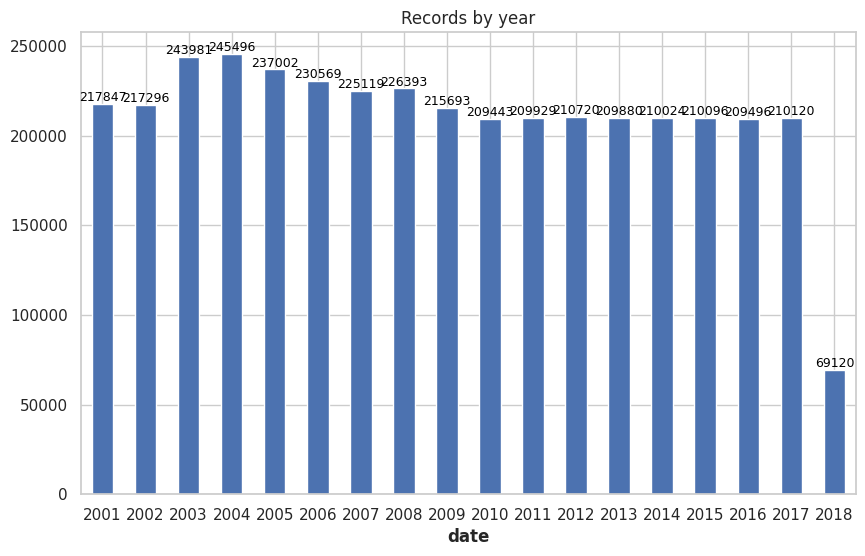

In [48]:
plt.figure(figsize=(10, 6))
ax = air_quality_count_by_year.plot(kind='bar', title="Records by year")

# Agregar los porcentajes encima de las barras
for i, v in enumerate(air_quality_count_by_year):
    ax.text(i, v + 1, f'{v:d}', ha='center', va='bottom', color='black',
            #rotation=45, rotation_mode='anchor',
            fontsize=9)

plt.xticks(rotation = 0)
plt.show()

You can see that 2018 is not complete.
Let's see how many months we have in 2018.

In [49]:
for month in range(1, 6):
  filtered_2018_by_month = (air_quality_df.index.year == 2018) & (air_quality_df.index.month == month)
  air_quality_2018_by_month_month_df = air_quality_df.loc[filtered_2018_by_month]
  print(f"month: {month}, shape: {air_quality_2018_by_month_month_df.shape[0]}")


month: 1, shape: 17856
month: 2, shape: 16128
month: 3, shape: 17856
month: 4, shape: 17256
month: 5, shape: 24


It can be seen that for 2018 we have data for up to May, although the month of May is not complete.

We analyze the stations.

In [50]:
# Num. of stations
print(f" Num. stattion: {len(air_quality_df.station.unique())}")
# Print unique stattions
print(f"Stations: {air_quality_df.station.unique()}")

 Num. stattion: 39
Stations: [28079019 28079099 28079025 28079024 28079023 28079022 28079021 28079036
 28079018 28079017 28079016 28079014 28079040 28079015 28079011 28079035
 28079003 28079004 28079012 28079006 28079039 28079008 28079009 28079038
 28079007 28079001 28079026 28079027 28079057 28079058 28079054 28079059
 28079047 28079049 28079060 28079056 28079055 28079050 28079048]


There are 39 stations that are more than 24 stations in the station dataset. This is not unusual, because there are stations that are out of service and not reflected in the station dataset.

We analyze the missing values, to do this we will calculate the percentage of missing values ​​for each one.

In [51]:
perc_missing_values = air_quality_df.apply(lambda x: x.isnull().mean())
perc_missing_values.drop(["station"], inplace=True)
perc_missing_values = perc_missing_values.sort_values(ascending=False)

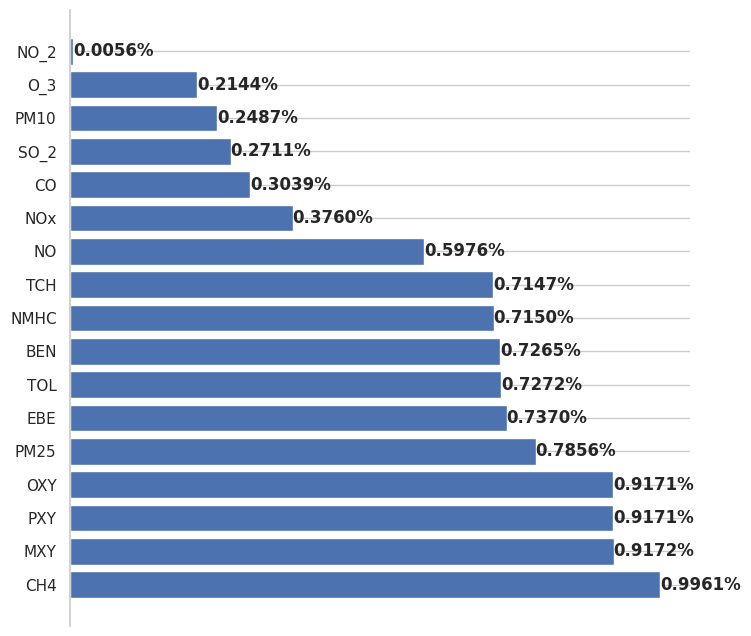

In [52]:
fig, ax = plt.subplots(figsize=(8,8))

bars = plt.barh(perc_missing_values.index, perc_missing_values.values)

ax.spines[['right', 'top', 'bottom']].set_visible(False)
ax.xaxis.set_visible(False)

ax.bar_label(bars,
             fontsize=12, label_type='edge', fmt='%.4f%%',
            fontweight='bold')

plt.show()

We print features that have less than 50% of missing values

In [53]:
perc_missing_values[perc_missing_values <= 0.5]

NOx     0.376015
CO      0.303872
SO_2    0.271062
PM10    0.248664
O_3     0.214402
NO_2    0.005560
dtype: float64

We visualize the missing values ​​by year using a bar chart.

In [54]:
missing_values_by_year_df = air_quality_df.groupby(air_quality_df.index.year).apply(lambda x: x.isnull().mean())
missing_values_by_year_df.drop(["station"], inplace=True, axis=1)
missing_values_by_year_df.head(5)

,BEN,CO,EBE,MXY,NMHC,NO_2,NOx,OXY,O_3,PM10,PXY,SO_2,TCH,TOL,NO,PM25,CH4
date,,,,,,,,,,,,,,,,,
2001,0.676925,0.007028,0.734929,0.803771,0.606568,0.007074,0.007133,0.803298,0.006234,0.046340,0.803348,0.006743,0.606210,0.677811,1.0,1.000000,1.0
2002,0.692825,0.003033,0.730561,0.810139,0.599413,0.003944,0.003944,0.809868,0.002623,0.037663,0.810135,0.003631,0.599091,0.693414,1.0,1.000000,1.0
2003,0.714142,0.076408,0.748985,0.827675,0.541161,0.005570,0.005554,0.827564,0.040380,0.012653,0.827601,0.005144,0.540997,0.715396,1.0,1.000000,1.0
2004,0.734582,0.079240,0.768705,0.837602,0.561573,0.009027,0.009014,0.837541,0.047598,0.044164,0.837504,0.008530,0.561492,0.735576,1.0,0.763186,1.0
2005,0.703091,0.081620,0.709066,0.862664,0.608214,0.008346,0.008232,0.862638,0.058379,0.020498,0.862664,0.007270,0.607278,0.703576,1.0,0.707146,1.0


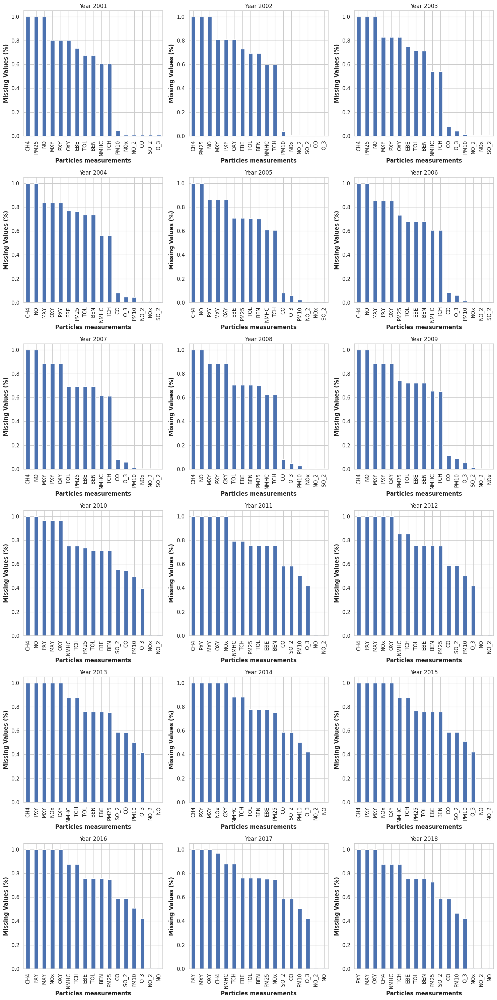

In [55]:
# Get yerar number to calcute grid size
years = missing_values_by_year_df.index.unique().sort_values()
n_years = len(years)

# Define row and column number for grid
ncols = 3  # Puedes ajustar el número de columnas que desees
nrows = (n_years + ncols - 1) // ncols  # Esto asegura que el número de filas sea suficiente para todos los años

# Create figure and subgraphs
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))

# Aplanar la matriz de ejes (en caso de que haya más de una fila y columna)
axes = axes.flatten()

# Create bar plot each year
missing_values_by_year_dict = {}
for i, year in enumerate(years):
    ax = axes[i]
    perc_missing_values_year = missing_values_by_year_df.loc[year]
    perc_missing_values_year = perc_missing_values_year.sort_values(ascending=False)

    # Plot
    perc_missing_values_year.plot(kind='bar', ax=ax)
    # Add Text
    ax.set_title(f'Year {year}')
    ax.set_xlabel('Particles measurements')
    ax.set_ylabel('Missing Values (%)')
    #ax.set_ylim(0, 100)  # Limitar el eje Y de 0 a 100%
    ax.grid(True, axis='y')

# Eliminar los ejes vacíos si hay menos años que subgráficas
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el layout para evitar que las etiquetas se solapen
plt.tight_layout()

# Mostrar la gráfica
plt.show()

We plot features that have less than 50% missing values ​​per year. In addition, we check which of these columns are part of columns with less than 50% of the entire dataset.

The idea is to identify those columns with less than 50% that are repeated in most years and do not bias the results.

In [56]:
smaller_missing_values_feat = perc_missing_values[perc_missing_values <= 0.5].index.values
missing_values_by_year_df[smaller_missing_values_feat]

,NOx,CO,SO_2,PM10,O_3,NO_2
date,,,,,,
2001,0.007133,0.007028,0.006743,0.046340,0.006234,0.007074
2002,0.003944,0.003033,0.003631,0.037663,0.002623,0.003944
2003,0.005554,0.076408,0.005144,0.012653,0.040380,0.005570
2004,0.009014,0.079240,0.008530,0.044164,0.047598,0.009027
2005,0.008232,0.081620,0.007270,0.020498,0.058379,0.008346
2006,0.007429,0.081984,0.006258,0.013441,0.060975,0.007429
2007,0.005100,0.081610,0.003318,0.011247,0.058942,0.005042
2008,0.004775,0.080758,0.004364,0.027439,0.047161,0.004757
2009,0.005202,0.115340,0.013941,0.089692,0.051921,0.005216


It can be seen that in 7 out of the 18 years we barely have values ​​for the N0x column, so it would be best to discard this column.


Let's visualize the percentage of missing values ​​of **`N0x`** for these years.

In [57]:
missing_values_by_year_df["NOx"].loc[2011:2017]

date
2011    0.999881
2012    1.000000
2013    1.000000
2014    1.000000
2015    1.000000
2016    1.000000
2017    0.748744
Name: NOx, dtype: float64

It can be observed that the **`N0x`** column has missing values ​​greater than 50% in 5 years, from 2012 to 2016. In addition, in 2011 and 2017 it has many missing values. Therefore, this column can be discarded.


We are left with the columns `CO`, `SO_2`, `PM10`, `O_3` and `NO_2` which are the ones with the fewest missing values ​​and are candidates for imputing their values.

Let's visualize the columns that have missing values ​​between 50% and 80%.

In [58]:
medium_missing_values_feat = perc_missing_values[(perc_missing_values > .5) & (perc_missing_values <= .8)].index.values
medium_missing_values_feat

array(['PM25', 'EBE', 'TOL', 'BEN', 'NMHC', 'TCH', 'NO'], dtype=object)

In [59]:
# Print Medium Missing Values
# ['BEN', 'EBE', 'NMHC', 'TCH', 'TOL',
#  'CO', 'NO_2', 'O_3', 'PM10', 'SO_2']
missing_values_by_year_df[medium_missing_values_feat]

,PM25,EBE,TOL,BEN,NMHC,TCH,NO
date,,,,,,,
2001,1.000000,0.734929,0.677811,0.676925,0.606568,0.606210,1.000000
2002,1.000000,0.730561,0.693414,0.692825,0.599413,0.599091,1.000000
2003,1.000000,0.748985,0.715396,0.714142,0.541161,0.540997,1.000000
2004,0.763186,0.768705,0.735576,0.734582,0.561573,0.561492,1.000000
2005,0.707146,0.709066,0.703576,0.703091,0.608214,0.607278,1.000000
2006,0.732145,0.679276,0.679744,0.679142,0.606062,0.605810,1.000000
2007,0.694077,0.694015,0.694184,0.694006,0.614057,0.613422,1.000000
2008,0.700371,0.703856,0.704315,0.703842,0.624193,0.624070,1.000000
2009,0.741188,0.721447,0.722193,0.721442,0.653438,0.651282,1.000000


As you can see the column `NO` has 100% missing values ​​for 10 years, between 2001 and 2010. Therefore, we can discard this column as it has too many missing values.

The column `PM25` has 100% missing values ​​for 3 years, between 2001 and 2003. Furthermore, it has an average of about 70% missing values ​​for the rest of the years. Therefore, we can also discard this column as it has too many missing values.

Let's analyze the rest of the columns **`EN`**, **`TOL`**, **`BEN`**, **`NMHC`** and **`TCH`** which have missing values ​​between 50% and 80%.

In [60]:
#medium_rest_missing_values_feat = ["EBE", "TOL", "BEN","NMHC","TCH"]
filtered_medium_rest_missing_values_feat = medium_missing_values_feat[~((medium_missing_values_feat == "PM25")|(medium_missing_values_feat == "NO"))]
filtered_medium_rest_missing_values_feat

array(['EBE', 'TOL', 'BEN', 'NMHC', 'TCH'], dtype=object)

In [61]:
# Print Medium Missing Values
missing_values_by_year_df[filtered_medium_rest_missing_values_feat]

,EBE,TOL,BEN,NMHC,TCH
date,,,,,
2001,0.734929,0.677811,0.676925,0.606568,0.606210
2002,0.730561,0.693414,0.692825,0.599413,0.599091
2003,0.748985,0.715396,0.714142,0.541161,0.540997
2004,0.768705,0.735576,0.734582,0.561573,0.561492
2005,0.709066,0.703576,0.703091,0.608214,0.607278
2006,0.679276,0.679744,0.679142,0.606062,0.605810
2007,0.694015,0.694184,0.694006,0.614057,0.613422
2008,0.703856,0.704315,0.703842,0.624193,0.624070
2009,0.721447,0.722193,0.721442,0.653438,0.651282


In [62]:
# Group by year and station
air_quality_by_year_station = air_quality_df.groupby([air_quality_df.index.year, "station"]).count()

In [63]:
#for col in medium_rest_missing_values_feat:
for col in filtered_medium_rest_missing_values_feat:
  print("="*50)
  print(f"Feature: {col}")
  print("="*50)
  for year in range(2001, 2019):
    stations = air_quality_by_year_station[air_quality_by_year_station[col] > 0][col].loc[year].index.get_level_values('station')
    print(f"[{year}] stations: {np.sort(stations.values)}")
  print("="*50)

Feature: EBE
[2001] stations: [28079006 28079008 28079015 28079023 28079024 28079025 28079035 28079099]
[2002] stations: [28079006 28079015 28079023 28079024 28079025 28079035 28079099]
[2003] stations: [28079006 28079008 28079015 28079023 28079024 28079025 28079035 28079099]
[2004] stations: [28079006 28079008 28079015 28079023 28079024 28079025 28079035 28079099]
[2005] stations: [28079006 28079008 28079015 28079023 28079024 28079025 28079026 28079027
 28079035 28079099]
[2006] stations: [28079006 28079008 28079015 28079023 28079024 28079026 28079027 28079035
 28079099]
[2007] stations: [28079006 28079008 28079015 28079023 28079024 28079026 28079027 28079099]
[2008] stations: [28079006 28079008 28079015 28079023 28079024 28079026 28079027 28079099]
[2009] stations: [28079006 28079008 28079011 28079018 28079023 28079024 28079026 28079027
 28079038 28079099]
[2010] stations: [28079008 28079011 28079018 28079024 28079026 28079038 28079055 28079099]
[2011] stations: [28079008 28079011 28

In [64]:
missing_values_by_station_df = air_quality_df.groupby("station").apply(lambda x: x.isnull().mean())
missing_values_by_station_df.drop(["station"], inplace=True, axis=1)
missing_values_by_station_df.head(5).transpose()

station,28079001,28079003,28079004,28079006,28079007
BEN,1.000000,1.000000,1.000000,0.024828,1.000000
CO,0.006511,0.009030,0.003709,0.007750,0.007295
EBE,1.000000,1.000000,1.000000,0.025199,1.000000
MXY,1.000000,1.000000,1.000000,0.026020,1.000000
NMHC,1.000000,1.000000,1.000000,0.013076,0.023128
NO_2,0.006069,0.010245,0.003314,0.010347,0.009021
NOx,0.006110,0.010256,0.391735,0.010374,0.009021
OXY,1.000000,1.000000,1.000000,0.025437,1.000000
O_3,0.015483,0.018404,0.482659,0.008148,0.009152
PM10,0.005751,0.124817,0.484279,0.009208,0.011387


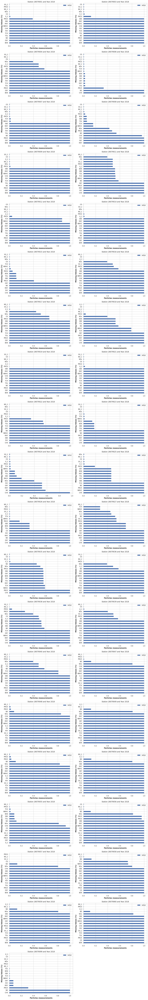

In [65]:
# Obtener las estaciones únicas para este año
stations = missing_values_by_station_df.index.unique()
n_stations = len(stations)

# Definir el número de filas y columnas para el grid
ncols = 2  # Ajusta el número de columnas
nrows = (n_stations + ncols - 1) // ncols  # Calcular el número de filas necesarias

# Crear la figura y los subgráficos
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))

# Aplanar la matriz de ejes
axes = axes.flatten()

# Crear una gráfica de barras para cada estación
for i, station in enumerate(stations):
    ax = axes[i]
    perc_missing_values_by_station = missing_values_by_station_df[missing_values_by_station_df.index == station].transpose()
    perc_missing_values_by_station.columns = ['value']
    perc_missing_values_by_station.sort_values('value', ascending=False, inplace=True)

    perc_missing_values_by_station.plot(kind='barh', ax=ax)
    ax.set_title(f'Station {station} and Year {year}')
    ax.set_xlabel('Particles measurements')
    ax.set_ylabel('Missing Values (%)')
    #ax.set_ylim(0, 100)  # Limitar el eje Y de 0 a 100%
    ax.grid(True, axis='y')

# Eliminar los ejes vacíos si hay menos estaciones que subgráficas
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el layout para evitar que las etiquetas se solapen
plt.tight_layout()

# Mostrar la gráfica
plt.show()

It can be seen that not all stations collect the same metrics. There is a pattern where a particular group of stations collect some metrics for a period of time and then are replaced by others. This makes sense as described in the dataset, some stations are removed.

We are left with the measurements that have few missing values (`CO`, `SO_2`, `PM10`, `O_3`, and `NO_2`) and those that have a medium number of missing values (`EBE`, `TOL`, `BEN`, `NMHC`, and `TCH`).


In [66]:
filtered_columns = ['EBE', 'TOL', 'BEN', 'NMHC', 'TCH', 'CO', 'SO_2', 'PM10', 'O_3', 'NO_2']

In [67]:
filtered_air_quality_df = air_quality_df[filtered_columns]
filtered_air_quality_df.head(10)

,EBE,TOL,BEN,NMHC,TCH,CO,SO_2,PM10,O_3,NO_2
date,,,,,,,,,,
2001-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,1.45,10.860000,21.219999,4.180000,50.389999
2001-01-01 01:00:00,2.56,10.74,3.23,0.24,1.58,1.25,22.100000,30.559999,7.830000,55.290001
2001-01-01 01:00:00,1.44,7.04,2.13,NaN,NaN,0.87,11.420000,36.669998,8.350000,53.400002
2001-01-01 01:00:00,NaN,5.83,0.40,0.14,1.51,0.79,9.690000,14.440000,3.400000,47.320000
2001-01-01 01:00:00,0.96,4.49,1.08,0.10,1.42,0.67,9.350000,11.890000,32.490002,43.820000
2001-01-01 01:00:00,NaN,7.79,3.00,NaN,NaN,1.55,27.270000,19.610001,6.230000,55.270000
2001-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,0.92,32.520000,18.200001,4.990000,55.160000
2001-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,1.12,15.820000,27.469999,12.890000,81.360001
2001-01-01 01:00:00,NaN,NaN,NaN,0.79,2.15,3.62,23.389999,40.139999,7.440000,59.150002


Let's plot the pollutants over time.

In [68]:
def plot_ts_all_feat(data: pd.DataFrame, period='M'):
  data_resample = data.resample(period).mean()

  data_resample.plot(figsize=(14, 9))
  plt.title('Madrid Pollutants from 2001-2019', fontsize=25)
  plt.legend(loc='upper left')
  plt.show()


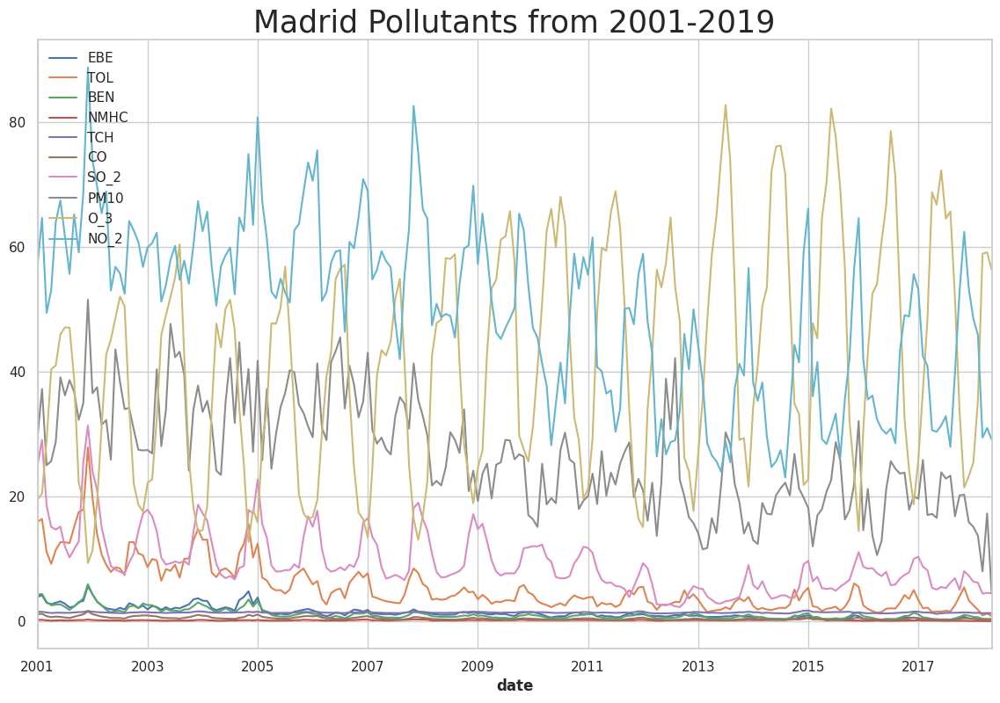

In [69]:
plot_ts_all_feat(filtered_air_quality_df, period='M')

Let's draw the pollutants across each year.

In [70]:
def plot_ts_all_feat_by_year(data: pd.DataFrame, period='M', agg=False):
  data_resample = data.resample(period).mean()
  if agg:
    data_resample = data_resample.sum(axis=1)

  # Get yerar number to calcute grid size
  years = data_resample.index.year.unique().sort_values()
  n_years = len(years)

  # Define row and column number for grid
  ncols = 2  # Puedes ajustar el número de columnas que desees
  nrows = (n_years + ncols - 1) // ncols  # Esto asegura que el número de filas sea suficiente para todos los años

  # Create figure and subgraphs
  fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))

  # Aplanar la matriz de ejes (en caso de que haya más de una fila y columna)
  axes = axes.flatten()

  # Create bar plot each year
  for i, year in enumerate(years):
      ax = axes[i]
      data_resample_by_year = data_resample[data_resample.index.year == year]
      #print(data_resample_by_year)
      # Plot
      data_resample_by_year.plot(ax=ax)
      # Add Text
      ax.set_title(f'Year {year}')
      ax.set_xlabel('Month')
      ax.set_ylabel('Pollution Sum')
      #ax.set_ylim(0, 100)  # Limitar el eje Y de 0 a 100%
      ax.grid(True, axis='y')

  # Eliminar los ejes vacíos si hay menos años que subgráficas
  for j in range(i + 1, len(axes)):
      fig.delaxes(axes[j])

  # Ajustar el layout para evitar que las etiquetas se solapen
  plt.tight_layout()

  # Mostrar la gráfica
  plt.show()

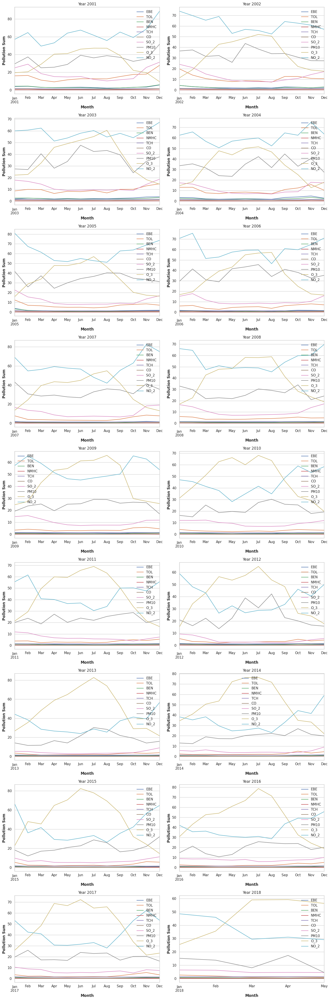

In [71]:
plot_ts_all_feat_by_year(filtered_air_quality_df, period='M')
#plot_ts_all_feat_by_year(filtered_air_quality_df, period='M', agg=True)

## Total Pollution

To simplify the analysis, we will create an index that is the sum of all pollutants. We will create three sets grouped by hour, day and month.

In [72]:
filtered_air_quality_df.shape

(3808224, 10)

In [73]:
air_qual_feats_montly_df = filtered_air_quality_df.resample('M').mean()
air_qual_tot_montly_df = air_qual_feats_montly_df.sum(axis=1).to_frame()
air_qual_tot_montly_df.columns = ['value']
print(f"Shape: {air_qual_tot_montly_df.shape}")
air_qual_tot_montly_df.head(5)

Shape: (209, 1)


,value
date,
2001-01-31,158.167557
2001-02-28,179.628900
2001-03-31,141.744123
2001-04-30,151.101535
2001-05-31,168.135903


In [74]:
air_qual_feats_daily_df = filtered_air_quality_df.resample('D').mean()
air_qual_tot_daily_df = air_qual_feats_daily_df.sum(axis=1).to_frame()
air_qual_tot_daily_df.columns = ['value']
print(f"Shape: {air_qual_tot_daily_df.shape}")
air_qual_tot_daily_df.head(5)

Shape: (6330, 1)


,value
date,
2001-01-01,130.318012
2001-01-02,131.611893
2001-01-03,140.406998
2001-01-04,137.539665
2001-01-05,139.908055


In [75]:
air_qual_feats_hourly_df = filtered_air_quality_df.resample('H').mean()
air_qual_tot_hourly_df = air_qual_feats_hourly_df.sum(axis=1).to_frame()
air_qual_tot_hourly_df.columns = ['value']
print(f"Shape: {air_qual_tot_hourly_df.shape}")
air_qual_tot_hourly_df.head(5)

Shape: (151896, 1)


,value
date,
2001-01-01 01:00:00,135.269528
2001-01-01 02:00:00,163.473249
2001-01-01 03:00:00,194.583278
2001-01-01 04:00:00,187.097163
2001-01-01 05:00:00,159.303074


In [76]:
filtered_air_quality_df[filtered_air_quality_df.index == '2001-01-01 01:00:00'].head(5)

,EBE,TOL,BEN,NMHC,TCH,CO,SO_2,PM10,O_3,NO_2
date,,,,,,,,,,
2001-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,1.45,10.86,21.219999,4.180000,50.389999
2001-01-01 01:00:00,2.56,10.74,3.23,0.24,1.58,1.25,22.10,30.559999,7.830000,55.290001
2001-01-01 01:00:00,1.44,7.04,2.13,NaN,NaN,0.87,11.42,36.669998,8.350000,53.400002
2001-01-01 01:00:00,NaN,5.83,0.40,0.14,1.51,0.79,9.69,14.440000,3.400000,47.320000
2001-01-01 01:00:00,0.96,4.49,1.08,0.10,1.42,0.67,9.35,11.890000,32.490002,43.820000


In [77]:
filtered_air_quality_df[filtered_air_quality_df.index == '2001-01-01 01:00:00'].sum(axis=1).head(5)

date
2001-01-01 01:00:00     88.099998
2001-01-01 01:00:00    135.380000
2001-01-01 01:00:00    121.320000
2001-01-01 01:00:00     83.519999
2001-01-01 01:00:00    106.270002
dtype: float64

In [78]:
def plot_ts_all_feat_sum(data: pd.DataFrame, period='M'):
  data_resample = data.resample(period).mean().sum(axis=1)
  data_resample.plot(figsize=(14, 10))
  plt.title('Madrid Pollution from 2001-2019', fontsize=25)
  plt.legend(loc='upper left')
  plt.show()


Let's plot the pollution rate per hour.

2025-02-03 18:49:15 - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


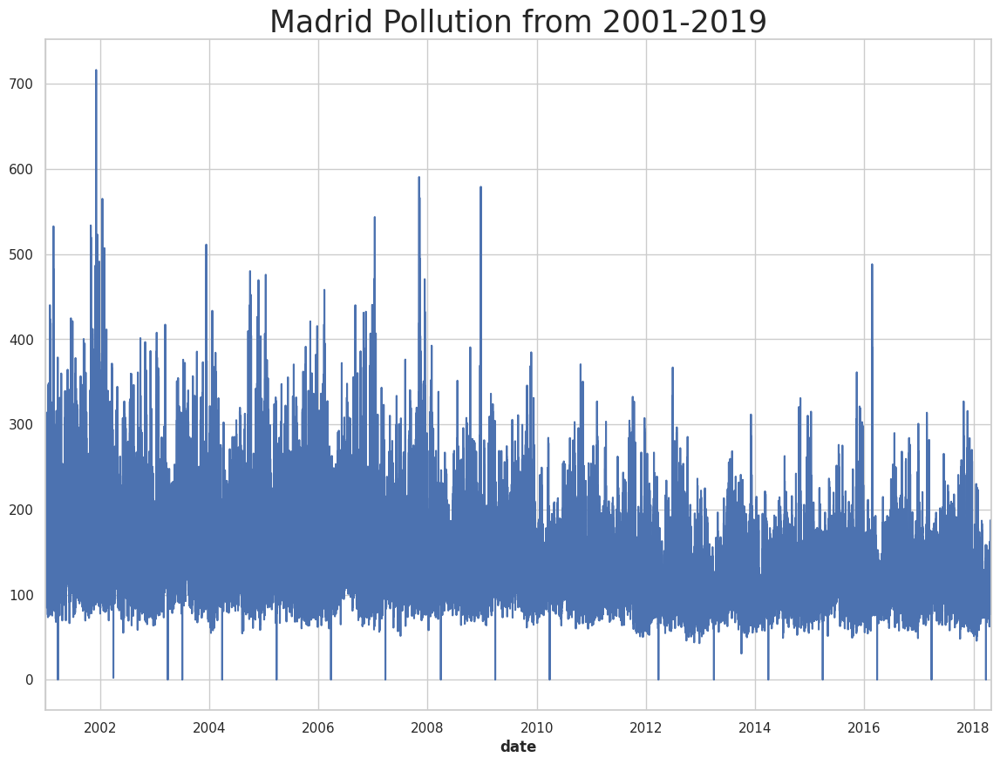

In [79]:
plot_ts_all_feat_sum(filtered_air_quality_df, period='H')

Let's plot the pollution rate per day.

2025-02-03 18:49:20 - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


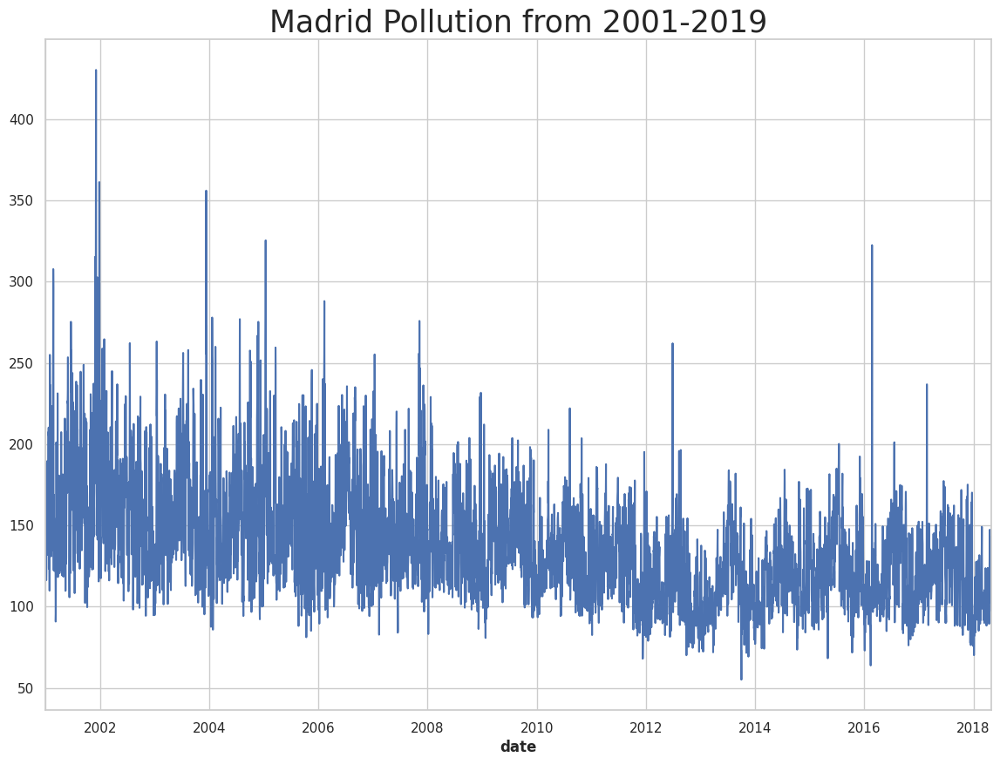

In [80]:
plot_ts_all_feat_sum(filtered_air_quality_df, period='D')

In [81]:
#plot_ts_all_feat_sum(filtered_air_quality_df, period='W')

Let's plot the pollution rate per month.

2025-02-03 18:49:21 - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


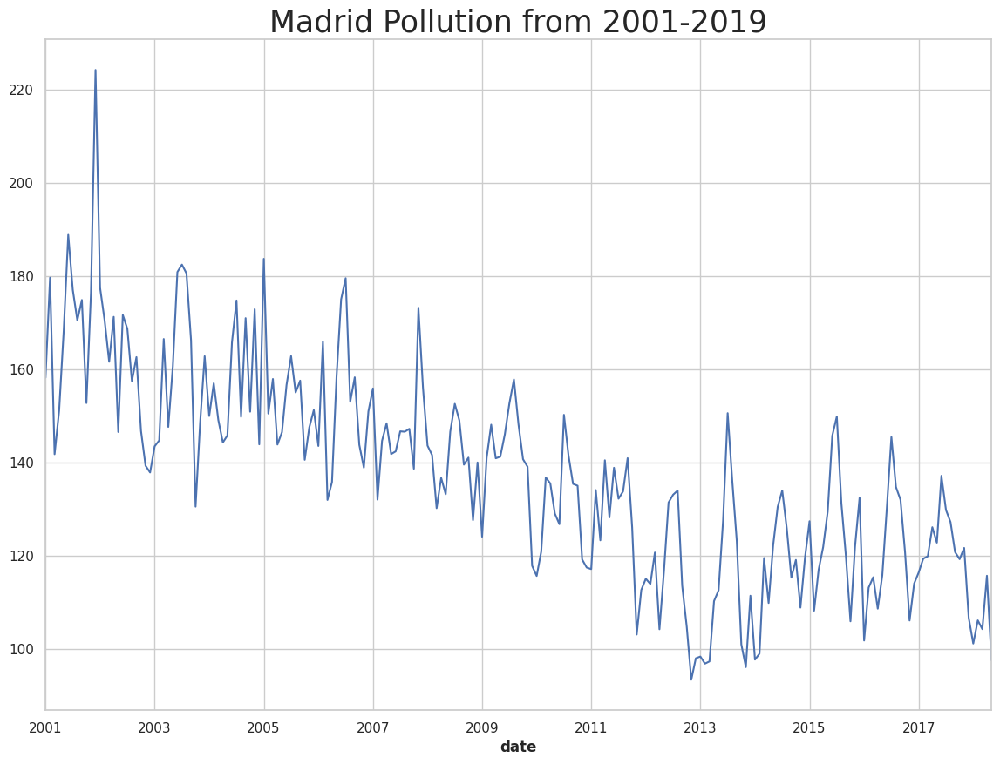

In [82]:
plot_ts_all_feat_sum(filtered_air_quality_df, period='M')

Let's visualize the average total pollution by month for each year.

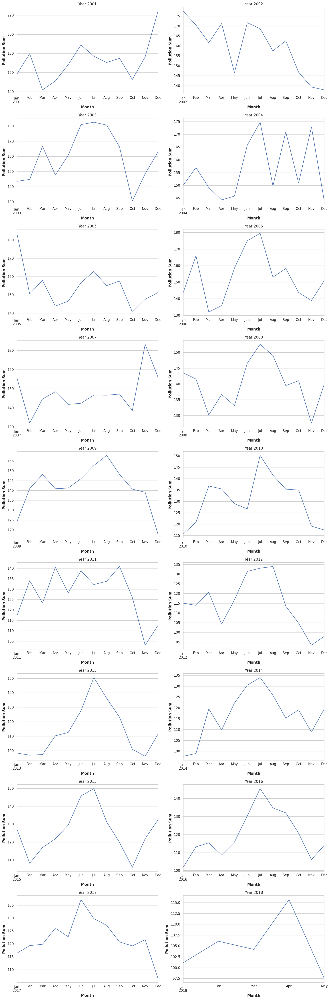

In [83]:
plot_ts_all_feat_by_year(filtered_air_quality_df, period='M', agg=True)

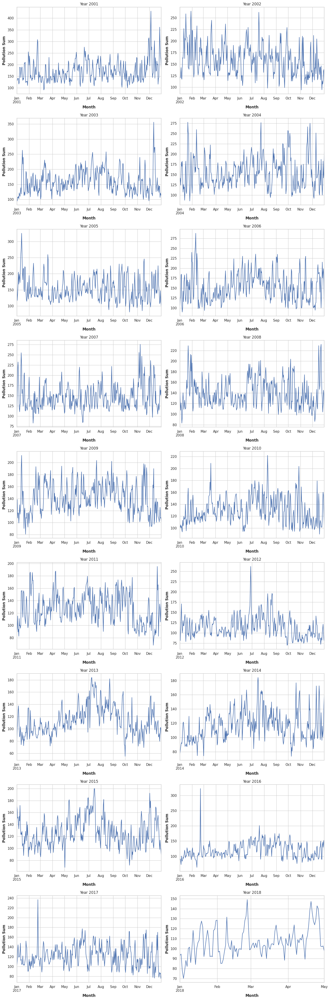

In [84]:
plot_ts_all_feat_by_year(filtered_air_quality_df, period='D', agg=True)

It can be seen that the months with the highest levels of pollution are June, July and August in most years. This may have an explanation in that Madrid is a city that receives a lot of tourism in the summer months, and people tend to be socializing outdoors and energy consumption is higher to combat the hot months.

In [85]:
air_qual_tot_hourly_df.head(5)

,value
date,
2001-01-01 01:00:00,135.269528
2001-01-01 02:00:00,163.473249
2001-01-01 03:00:00,194.583278
2001-01-01 04:00:00,187.097163
2001-01-01 05:00:00,159.303074


## Componentes

https://s-ai-f.github.io/Time-Series/outlier-detection-in-time-series.html#forecasting-based-approaches


https://otexts.com/fpp2/decomposition.html


### Hourly

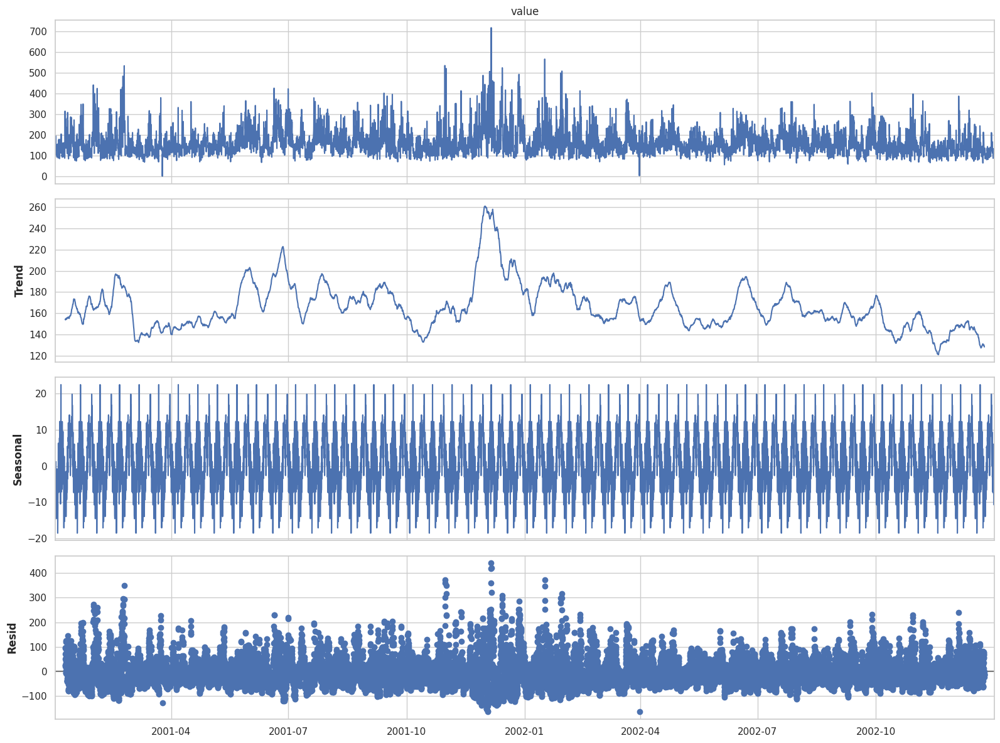

In [86]:
# Plot Components

#comp_qual_tot_montly = seasonal_decompose(air_quality_total_montly_df["value"], model='additive', period=12)
decomp_air_qual_tot_hourly = seasonal_decompose(air_qual_tot_hourly_df["value"].loc["2001-01-01":"2002-12-31"], model='additive', period=365)
fig = decomp_air_qual_tot_hourly.plot()
fig.set_size_inches((16, 12))
# Tight layout to realign things
fig.tight_layout()
plt.show()

<Axes: xlabel='date'>

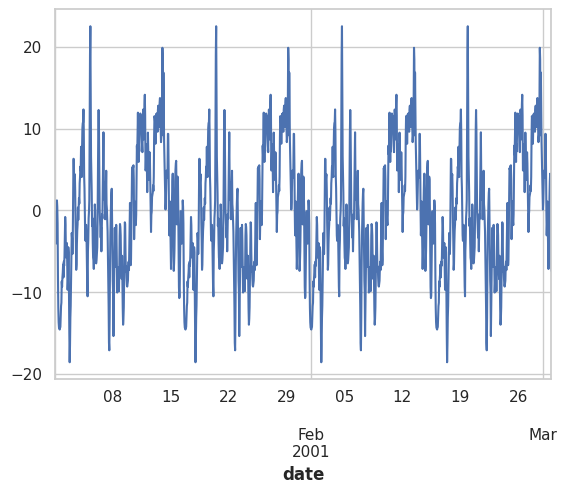

In [87]:
decomp_air_qual_tot_hourly.seasonal[:2*30*24].plot()

In [88]:
def visualize_blox_ts(df, period="day"):
  if period == 'month':
    indices = df.index.month
  elif period == 'week':
    indices = df.index.isocalendar().week
  elif period == 'dayofweek':
    indices = df.index.dayofweek
  elif period == 'day':
    indices = df.index.day
  elif period == 'hour':
    indices = df.index.hour
  else:
    raise Exception("Date provided can't be in the past")

  fig, ax = plt.subplots(figsize=(18, 8))
  sns.boxplot(x = indices,
              y = df['consumption'],
              ax = ax)
  #
  plt.xlabel('Time')
  plt.title(f"Energy Consumption by {period}")

In [89]:
#visualize_blox_ts(air_quality_total_montly_df)

In [90]:
def visualize_ts_acf_pacf(timeseries, lags=100):
  fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

  plt.suptitle('Summary of seasonal decomposition', y=1.02, fontsize=24)

  # Autorrelation
  plot_acf(timeseries, lags=lags, ax=axes[0])
  axes[0].set(xlabel="lag", ylabel="ACF value")
  #x.set(xlabel="lag", ylabel="ACF value")

  # Partial Autorrelation
  plot_pacf(timeseries, lags=lags, ax=axes[1], method='ols')
  axes[1].set(xlabel="lag", ylabel="PACF value")

  plt.tight_layout()
  plt.show()

In [91]:
air_qual_tot_daily_df.head(5)

,value
date,
2001-01-01,130.318012
2001-01-02,131.611893
2001-01-03,140.406998
2001-01-04,137.539665
2001-01-05,139.908055


In [92]:
#air_qual_tot_daily_df["value"].loc["2001-01-01":"2001-12-31"]
air_qual_tot_montly_df.head(5)

,value
date,
2001-01-31,158.167557
2001-02-28,179.628900
2001-03-31,141.744123
2001-04-30,151.101535
2001-05-31,168.135903


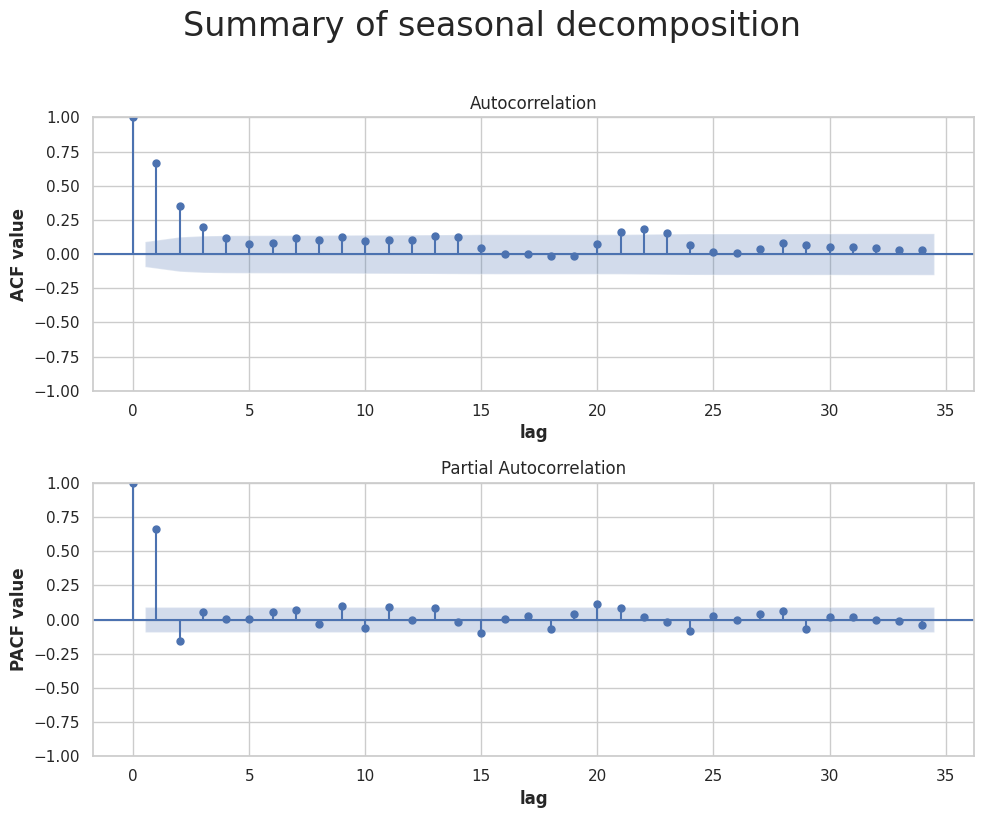

In [93]:
#visualize_ts_acf_pacf(air_quality_total_montly_df["value"])
visualize_ts_acf_pacf(air_qual_tot_daily_df["value"].loc["2001-01-01":"2002-03-31"], lags=34)

In [94]:
# Graficar autocorrelación
#plot_acf(air_quality_total_montly_df["value"], lags=50)
#plt.show()

In [95]:

def check_stationarity(series, alpha=0.5):
    # Copied from https://machinelearningmastery.com/time-series-data-stationary-python/

    # Run test
    result = adfuller(series.values)

    # Print test statistic
    print('ADF Statistic: %f' % result[0])
    # Print p-value
    print('p-value: %f' % result[1])
    # Print critical values
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= alpha) & (result[4]['5%'] > result[0]):
        print("\u001b[32mStationary\u001b[0m")
    else:
        print("\x1b[31mNon-stationary\x1b[0m")

In [96]:
#check_stationarity(air_quality_total_montly_df)
check_stationarity(air_qual_tot_daily_df["value"])

ADF Statistic: -5.491412
p-value: 0.000002
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Stationary


In [97]:
air_qual_tot_daily_df['diff_value'] = air_qual_tot_daily_df["value"].diff()
check_stationarity(air_qual_tot_daily_df['diff_value'].dropna())

ADF Statistic: -20.509142
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Stationary


### Daily

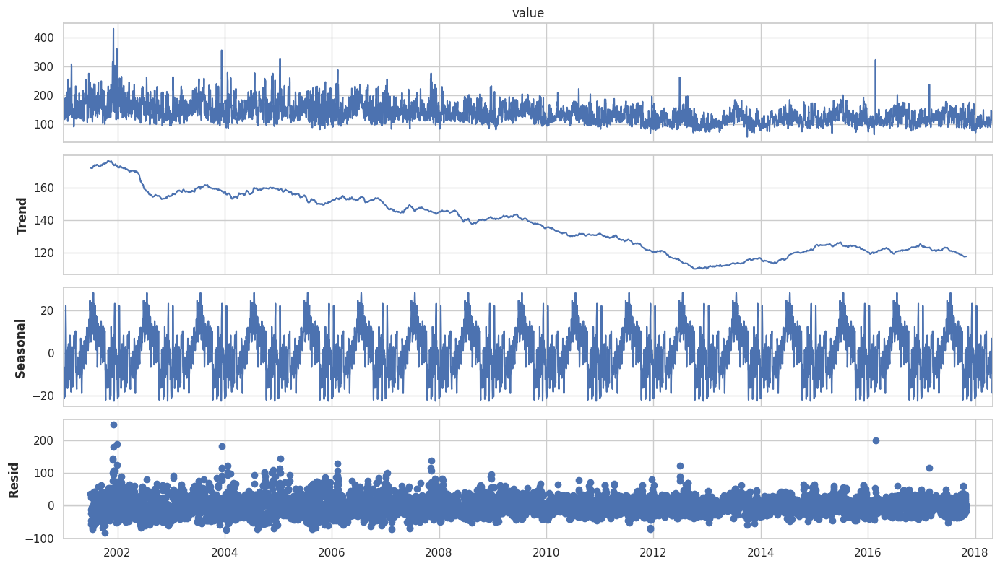

In [98]:
# Plot Components
decomp_air_qual_tot_daily = seasonal_decompose(air_qual_tot_daily_df["value"], model='additive', period=365)
fig = decomp_air_qual_tot_daily.plot()
fig.set_size_inches((14, 8))
# Tight layout to realign things
fig.tight_layout()
plt.show()

<Axes: xlabel='date'>

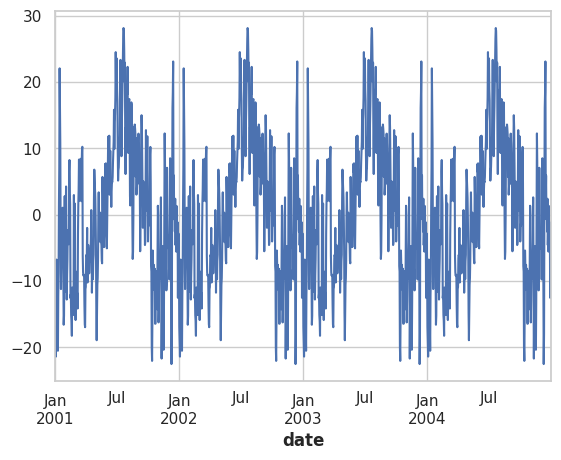

In [99]:
decomp_air_qual_tot_daily.seasonal[:365*4].plot()

<Axes: xlabel='date'>

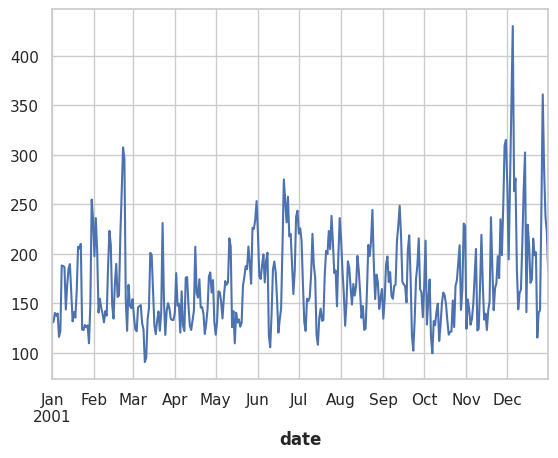

In [100]:
air_qual_tot_daily_df[:365*1]["value"].plot()

In [101]:
#check_stationarity(air_quality_total_montly_df)
check_stationarity(air_qual_tot_daily_df["value"])

ADF Statistic: -5.491412
p-value: 0.000002
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Stationary


In [102]:
air_qual_tot_daily_df['diff_value'] = air_qual_tot_daily_df["value"].diff()
check_stationarity(air_qual_tot_daily_df['diff_value'].dropna())

ADF Statistic: -20.509142
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Stationary


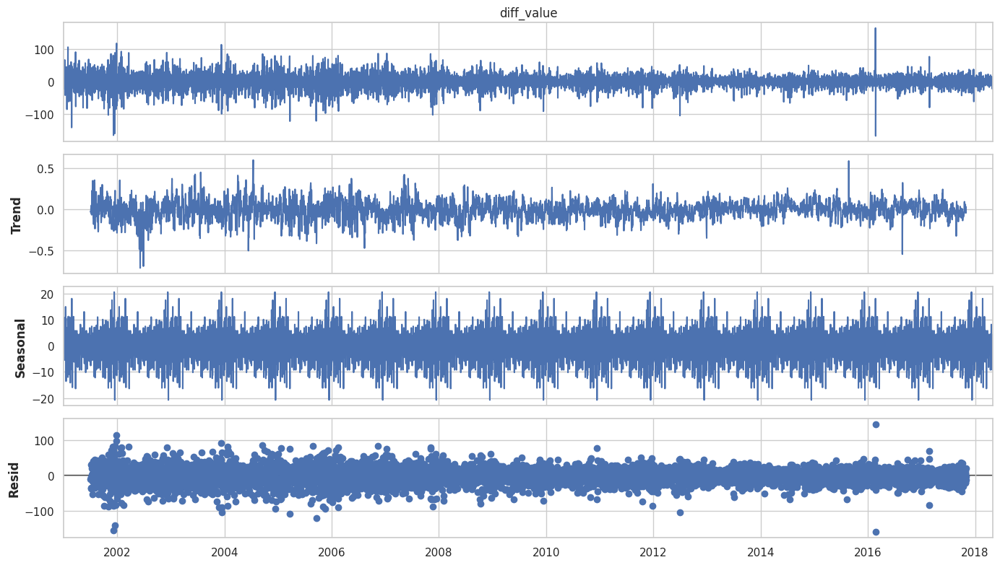

In [103]:
# Plot Components
decomp_diff_air_qual_tot_daily = seasonal_decompose(air_qual_tot_daily_df["diff_value"].dropna(), model='additive', period=365)
fig = decomp_diff_air_qual_tot_daily.plot()
fig.set_size_inches((14, 8))
# Tight layout to realign things
fig.tight_layout()
plt.show()

<Axes: xlabel='date'>

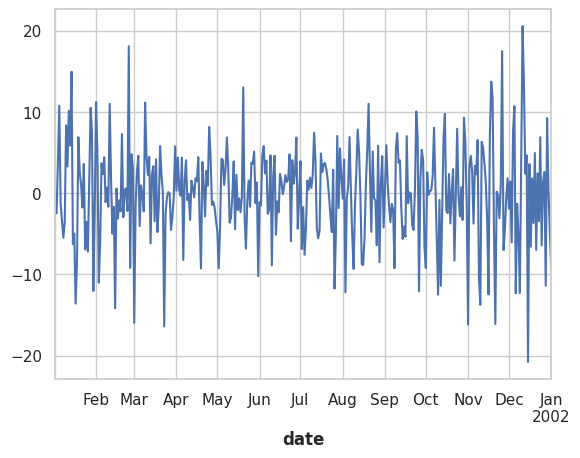

In [104]:
decomp_diff_air_qual_tot_daily.seasonal[:365].plot()

### Montly

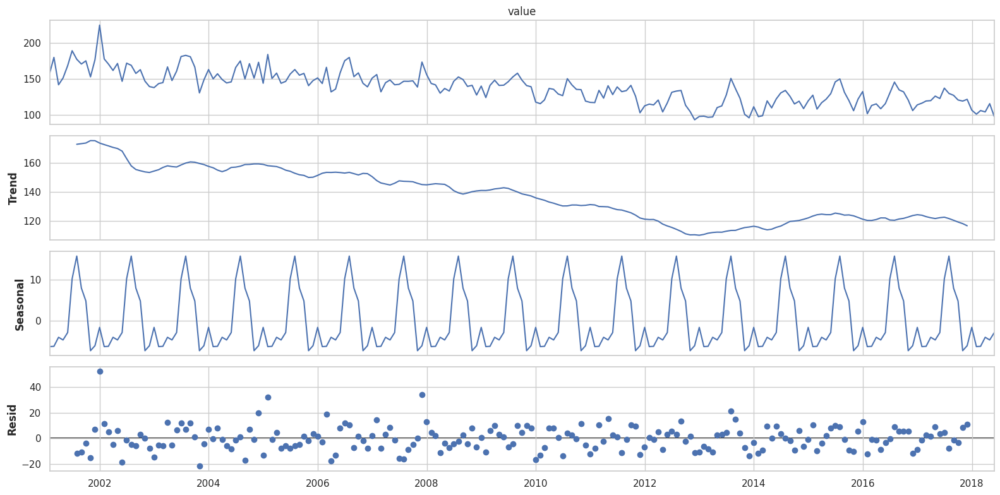

In [105]:
# Plot decompose montly
decomp_air_qual_tot_montly = seasonal_decompose(air_qual_tot_montly_df["value"], model='additive', period=12)
fig = decomp_air_qual_tot_montly.plot()
fig.set_size_inches((16, 8))
# Tight layout to realign things
fig.tight_layout()
plt.show()

<Axes: xlabel='date'>

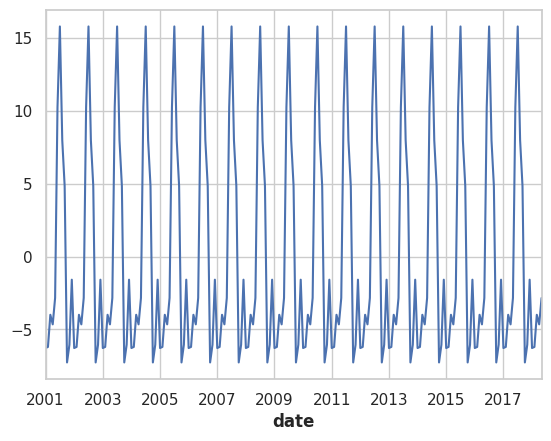

In [106]:
decomp_air_qual_tot_montly.seasonal.plot()

In [107]:
#check_stationarity(air_quality_total_montly_df)
check_stationarity(air_qual_tot_montly_df["value"])

ADF Statistic: -1.168184
p-value: 0.687130
Critical Values:
	1%: -3.464
	5%: -2.876
	10%: -2.575
Non-stationary


In [108]:
air_qual_tot_montly_df['diff_value'] = air_qual_tot_montly_df["value"].diff()
check_stationarity(air_qual_tot_montly_df['diff_value'].dropna())

ADF Statistic: -9.912638
p-value: 0.000000
Critical Values:
	1%: -3.464
	5%: -2.876
	10%: -2.575
Stationary


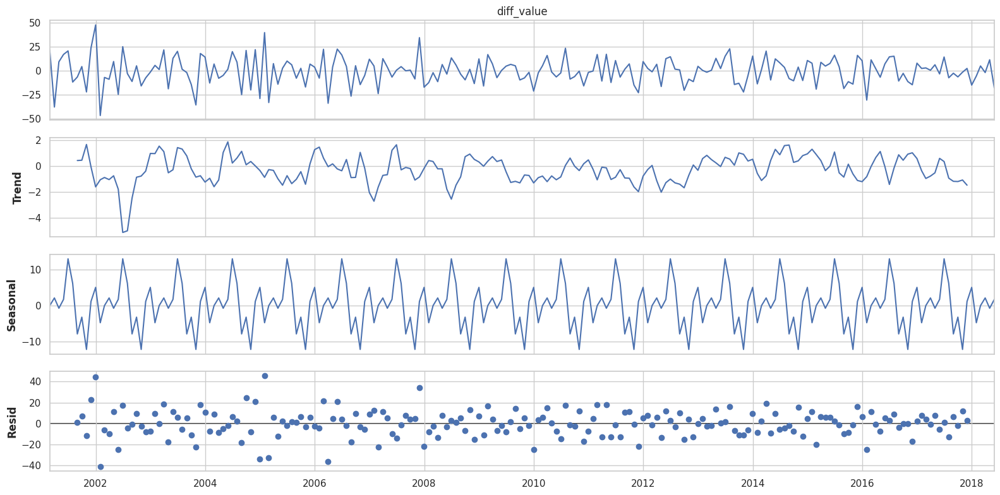

In [109]:
# Plot decompose montly
decomp_diff_air_qual_tot_montly = seasonal_decompose(air_qual_tot_montly_df["diff_value"].dropna(), model='additive', period=12)
fig = decomp_diff_air_qual_tot_montly.plot()
fig.set_size_inches((16, 8))
# Tight layout to realign things
fig.tight_layout()
plt.show()

<Axes: xlabel='date'>

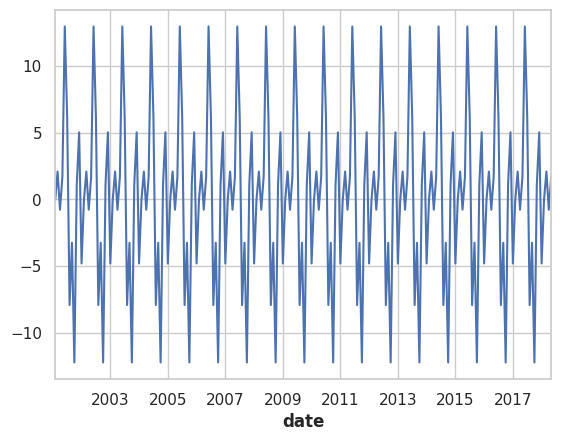

In [110]:
decomp_diff_air_qual_tot_montly.seasonal.plot()

## Outliers

https://medium.com/@alex.eslava96/outlier-detection-techniques-for-time-series-9868db2875c2

The next point will be to determine the outliers in the time series.

### Daily

In [111]:
def detect_resid_anomalies(resid):
  resid_mu = resid.mean()
  resid_dev = resid.std()

  lower = resid_mu - 3*resid_dev
  upper = resid_mu + 3*resid_dev

  anomalies = resid[(resid < lower) | (resid > upper)]
  anomalies = anomalies.to_frame()

  return anomalies

def plot_resid_anomalies(resid):

  start_date = resid.index.min().to_pydatetime()
  end_date = resid.index.max().to_pydatetime()

  resid_mu = resid.mean()
  resid_dev = resid.std()

  lower = resid_mu - 3*resid_dev
  upper = resid_mu + 3*resid_dev

  anomalies = resid[(resid < lower) | (resid > upper)]
  anomalies = anomalies.to_frame()


  #plt.figure(figsize=(18,8))
  plt.rc('figure',figsize=(18,10))
  plt.rc('font',size=15)
  fig, ax = plt.subplots()
  x = resid.index
  y = resid.values
  ax.plot_date(x, y, color='black',linestyle='--', alpha=0.5)
  ax.fill_between([start_date, end_date], lower, upper, color='g', alpha=0.25, linestyle='--', linewidth=2)
  ax.set_xlim(start_date, end_date)
  ax.scatter(anomalies.index, anomalies.resid, color='r', marker='D', s=50)
  fig.autofmt_xdate()


def plot_resid_anomalies_zscore(resid):

  start_date = resid.index.min().to_pydatetime()
  end_date = resid.index.max().to_pydatetime()

  zscore = np.abs((resid - resid.mean()) / resid.std())
  lower = zscore - 3
  upper = zscore + 3
  anomalies = resid[(resid < lower) | (resid > upper)]
  anomalies = anomalies.to_frame()


  #plt.figure(figsize=(18,8))
  plt.rc('figure',figsize=(18,10))
  plt.rc('font',size=15)
  fig, ax = plt.subplots()
  x = resid.index
  y = resid.values
  ax.plot_date(x, y, color='black',linestyle='--', alpha=0.5)
  #ax.fill_between([start_date, end_date], lower, upper, color='g', alpha=0.25, linestyle='--', linewidth=2)
  ax.set_xlim(start_date, end_date)
  ax.scatter(anomalies.index, anomalies.resid, color='r', marker='D', label='Outliers (Z-score)')
  fig.autofmt_xdate()


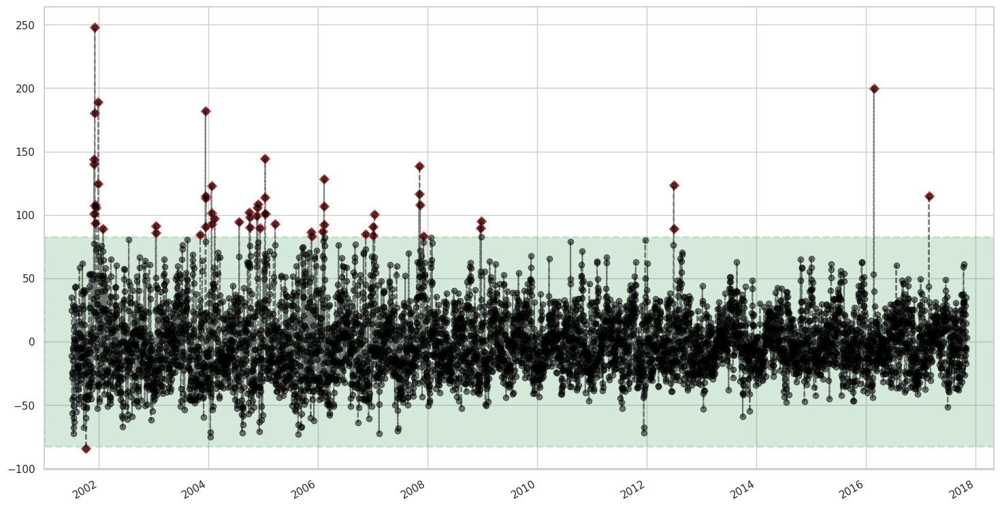

In [112]:
#plot_resid_anomalies(decomp_diff_air_quality_total_montly.resid)
plot_resid_anomalies(decomp_air_qual_tot_daily.resid)

In [113]:
#plot_resid_anomalies_zscore(comp_qual_tot_daily.resid)

In [114]:
outliers_stl_daily = detect_resid_anomalies(decomp_air_qual_tot_daily.resid)
print(f"Outliers: {len(outliers_stl_daily)}")
outliers_stl_daily.head(5)

Outliers: 57


,resid
date,
2001-10-07,-84.045159
2001-11-29,140.053917
2001-11-30,144.047343
2001-12-01,100.644242
2001-12-03,107.319981


In [115]:
air_qual_tot_daily_df.loc[outliers_stl_daily.index].head(10)

,value,diff_value
date,,
2001-10-07,99.638072,-15.825589
2001-11-29,309.674578,62.242948
2001-11-30,315.258177,5.583599
2001-12-01,269.823191,-45.434986
2001-12-03,271.909019,77.389457
2001-12-04,352.180466,80.271447
2001-12-05,430.259713,78.079246
2001-12-06,263.491528,-166.768184
2001-12-07,276.224667,12.733138


In [116]:
# Reemplazar los outliers en la serie por interpolación lineal
air_qual_tot_daily_df['clean_value'] = air_qual_tot_daily_df['value']
air_qual_tot_daily_df['clean_value'].loc[outliers_stl_daily.index] = np.nan
air_qual_tot_daily_df['clean_value'] = air_qual_tot_daily_df['clean_value'].interpolate(method='linear')

In [117]:
air_qual_tot_daily_df.head(5)

,value,diff_value,clean_value
date,,,
2001-01-01,130.318012,NaN,130.318012
2001-01-02,131.611893,1.293881,131.611893
2001-01-03,140.406998,8.795105,140.406998
2001-01-04,137.539665,-2.867333,137.539665
2001-01-05,139.908055,2.368391,139.908055


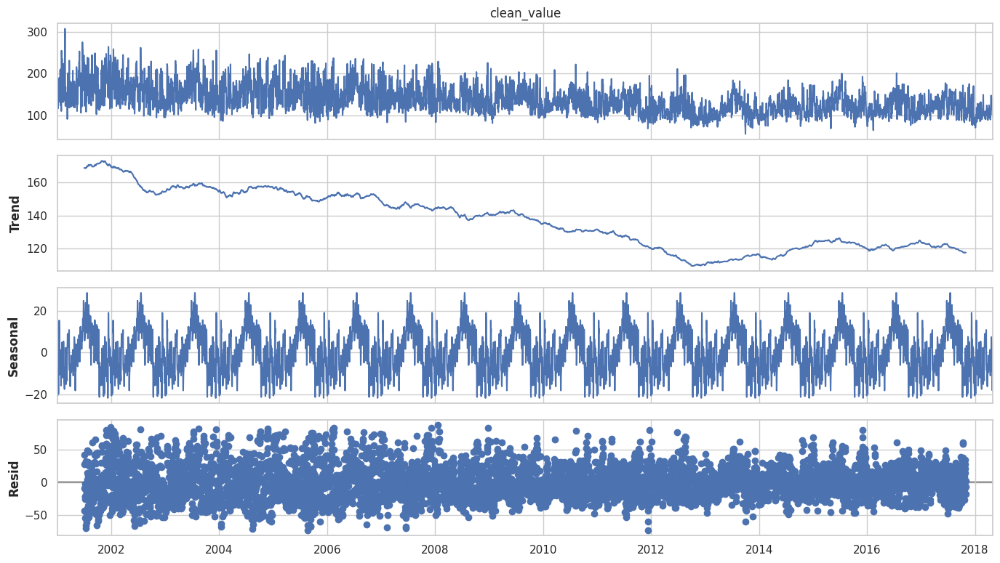

In [118]:
comp_clean_air_qual_tot_daily = seasonal_decompose(air_qual_tot_daily_df["clean_value"], model='additive', period=365)
fig = comp_clean_air_qual_tot_daily.plot()
fig.set_size_inches((14, 8))
# Tight layout to realign things
fig.tight_layout()
plt.show()

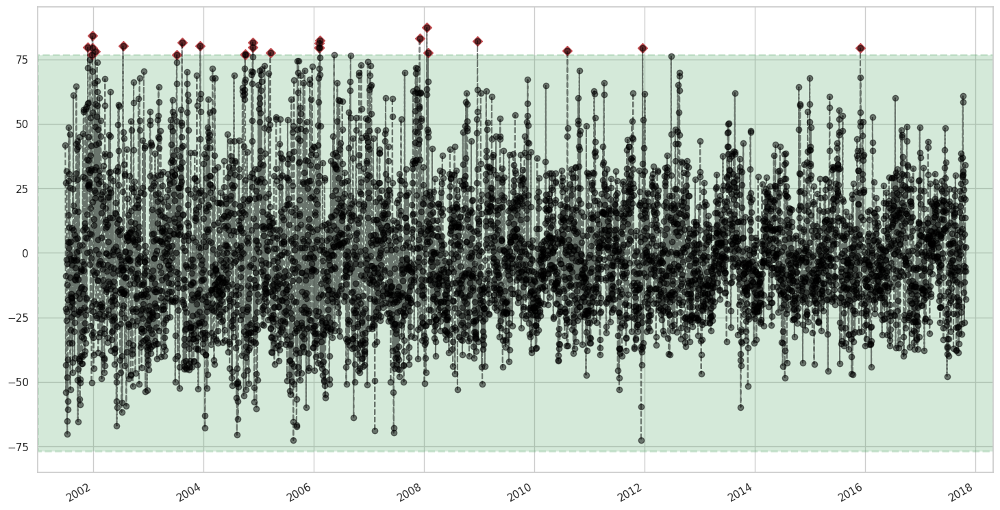

In [119]:
plot_resid_anomalies(comp_clean_air_qual_tot_daily.resid)

### Montly

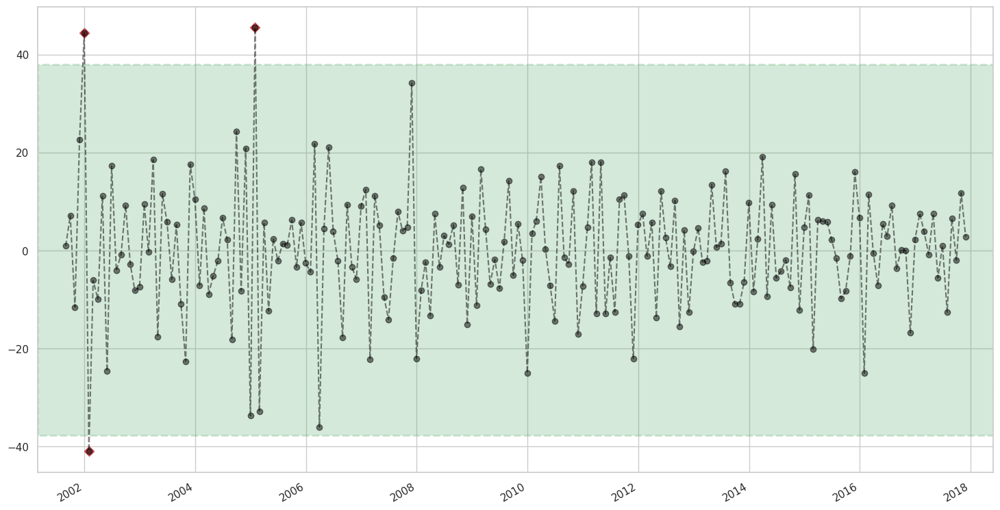

In [120]:
plot_resid_anomalies(decomp_diff_air_qual_tot_montly.resid)

In [121]:
air_qual_tot_montly_df['residual'] = decomp_diff_air_qual_tot_montly.resid

In [122]:
air_qual_tot_montly_df['Z-Score'] = np.abs((air_qual_tot_montly_df['residual'] - air_qual_tot_montly_df['residual'].mean()) / air_qual_tot_montly_df['residual'].std())
outliers_stl = air_qual_tot_montly_df[air_qual_tot_montly_df['Z-Score'] > 3]
outliers_stl["Z-Score"].head(20)

date
2001-12-31    3.508768
2002-01-31    3.247370
2005-01-31    3.595404
Name: Z-Score, dtype: float64

In [123]:
outliers_stl_montly = detect_resid_anomalies(decomp_diff_air_qual_tot_montly.resid)
outliers_stl_montly.head(5)

,resid
date,
2001-12-31,44.418429
2002-01-31,-40.882982
2005-01-31,45.512281


In [124]:
air_qual_tot_montly_df.loc[outliers_stl_montly.index]

,value,diff_value,residual,Z-Score
date,,,,
2001-12-31,224.225400,47.830592,44.418429,3.508768
2002-01-31,177.469271,-46.756130,-40.882982,3.247370
2005-01-31,183.684536,39.826187,45.512281,3.595404


In [125]:
# Reemplazar los outliers en la serie por interpolación lineal
air_qual_tot_montly_df['clean_diff_value'] = air_qual_tot_montly_df['diff_value']
air_qual_tot_montly_df['clean_diff_value'].loc[outliers_stl.index] = np.nan
air_qual_tot_montly_df['clean_diff_value'] = air_qual_tot_montly_df['clean_diff_value'].interpolate(method='linear')

<Figure size 1000x800 with 0 Axes>

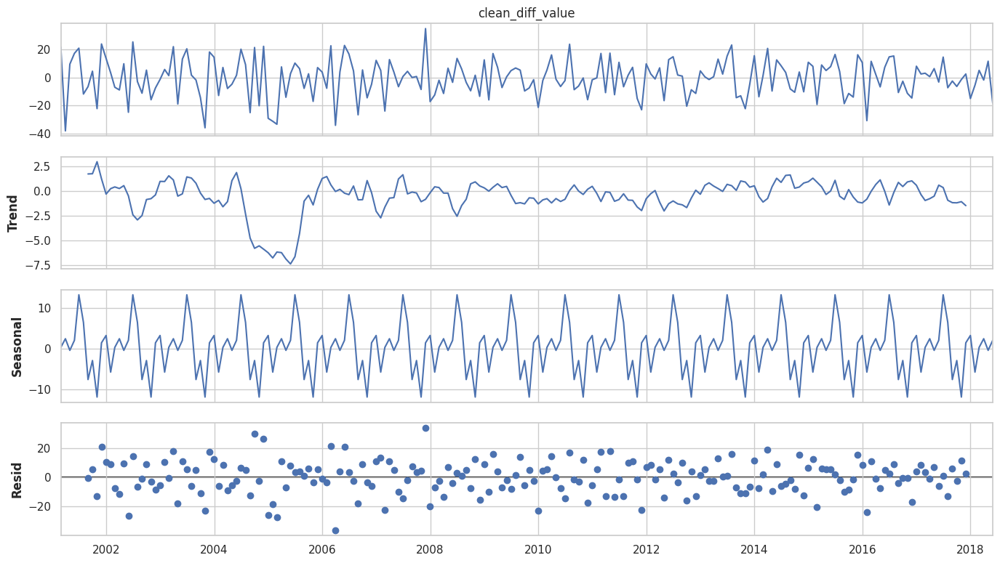

In [126]:
plt.figure(figsize=(10,8))
decomp_diff_air_qual_tot_montly = seasonal_decompose(air_qual_tot_montly_df["clean_diff_value"].dropna(), model='additive', period=12)
fig = decomp_diff_air_qual_tot_montly.plot()
fig.set_size_inches((14, 8))
# Tight layout to realign things
fig.tight_layout()
plt.show()

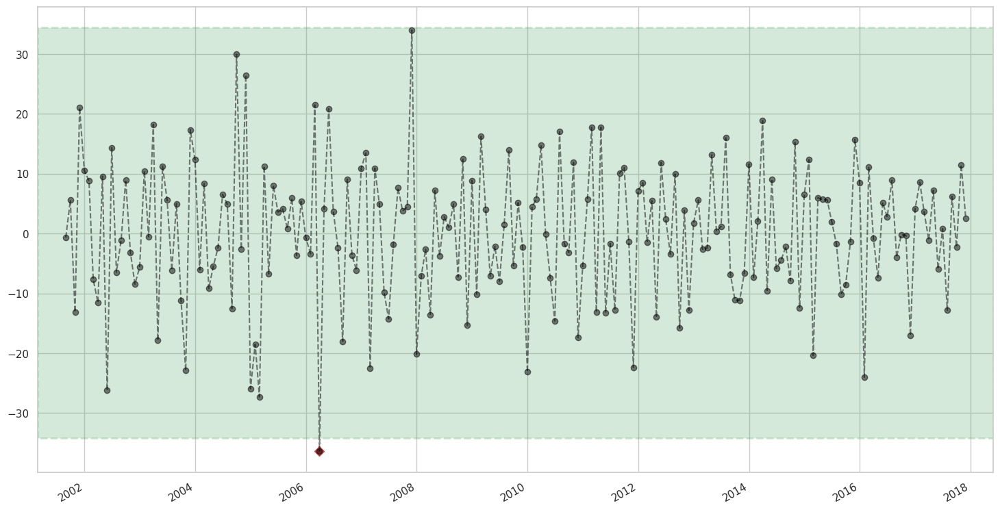

In [127]:
# Plot outliers
plot_resid_anomalies(decomp_diff_air_qual_tot_montly.resid)

# Data Wrangling

We read the air quality dataset.

In [128]:
def read_air_quality_dataset(data_dir: str):
    """
    Reads all CSV files in a specified directory and concatenates them into a single DataFrame.

    This function searches for `.csv` files within the provided directory,
    reads them, and combines them into a single pandas DataFrame. It is useful for
    merging multiple related data files, such as air quality data.

    Parameters:
    data_dir (str): The directory path where the CSV files are located.

    Returns:
    pd.DataFrame: A DataFrame containing the combined data from all the read CSV files.

    Example:
    >>> df = read_air_quality_data("/path/to/data")
    >>> df.head()

    Exceptions:
    - If no CSV files are found in the directory, the returned DataFrame will be empty.
    - If an error occurs while reading the CSV files, a pandas exception will be raised.

    Requires:
    - pandas (pd)
    - glob
    """
    # Path pattern for the CSV files
    csv_files = glob.glob(f'{data_dir}/*.csv')

    # Read all files and concatenate them into a single DataFrame
    df = pd.concat([pd.read_csv(f) for f in csv_files], ignore_index=True)

    return df


In [129]:
!ls -lh "{RAW_AQ_YEARS_DATA_DIR}" | head -n 10

total 498M
-rw-rw-rw- 1 codespace codespace  38M Feb  3 17:03 madrid_2001.csv
-rw-rw-rw- 1 codespace codespace  38M Feb  3 17:03 madrid_2002.csv
-rw-rw-rw- 1 codespace codespace  42M Feb  3 17:03 madrid_2003.csv
-rw-rw-rw- 1 codespace codespace  43M Feb  3 17:03 madrid_2004.csv
-rw-rw-rw- 1 codespace codespace  41M Feb  3 17:03 madrid_2005.csv
-rw-rw-rw- 1 codespace codespace  41M Feb  3 17:03 madrid_2006.csv
-rw-rw-rw- 1 codespace codespace  39M Feb  3 17:03 madrid_2007.csv
-rw-rw-rw- 1 codespace codespace  39M Feb  3 17:03 madrid_2008.csv
-rw-rw-rw- 1 codespace codespace  37M Feb  3 17:03 madrid_2009.csv


We transform the data column `date` into the index.

In [130]:
def check_stationarity(series: pd.Series, alpha: float = 0.05) -> bool:
    """
    Checks the stationarity of a time series using both the Augmented Dickey-Fuller (ADF) test
    and the Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test.

    The function applies two statistical tests for stationarity:
    1. **ADF Test**: The Augmented Dickey-Fuller test is a unit root test that checks for the presence
       of a unit root in the time series, which implies non-stationarity.
    2. **KPSS Test**: The Kwiatkowski-Phillips-Schmidt-Shin test checks for the presence of stationarity.

    If the time series is stationary, both tests will indicate this with a p-value below the threshold.

    Parameters:
    series (pd.Series): A pandas Series containing the time series data to test for stationarity.
    alpha (float, optional): The significance level for the hypothesis tests (default is 0.05).

    Returns:
    bool: Returns `True` if the time series is stationary according to both tests, `False` otherwise.

    Example:
    >>> check_stationarity(time_series_data)

    Exceptions:
    - The input `series` should be a pandas Series containing numerical data.
    - The function assumes that the time series does not contain missing values.

    Requires:
    - statsmodels (adfuller, kpss)
    """
    # Run Augmented Dickey-Fuller test (ADF)
    result_adf = adfuller(series.values)

    # Check stationarity decision based on ADF test
    adf_stationary = (result_adf[1] <= alpha) & (result_adf[4]['5%'] > result_adf[0])

    # Run Kwiatkowski-Phillips-Schmidt-Shin test (KPSS)
    result_kpss = kpss(series.values)

    # Check stationarity decision based on KPSS test
    kpss_stationary = (result_kpss[1] <= alpha) & (result_kpss[3]['5%'] > result_kpss[0])

    # If both tests indicate stationarity, return True, otherwise return False
    return adf_stationary and kpss_stationary


    import numpy as np
import warnings
from statsmodels.tsa.stattools import adfuller, kpss

def check_stationarity(series, alpha=0.05):
    """
    Performs ADF and KPSS tests on a time series and determines if it is stationary.

    Parameters:
        - series: Time series (Pandas Series or list of values).
        - alpha: Significance level (default 0.05).

    Returns:
        - True if the series is stationary, False if it is not.
    """

    # ADF test (Augmented Dickey-Fuller)
    adf_stat, adf_pvalue, _, _, adf_critical_values, _ = adfuller(series, autolag='AIC')

    # Suppress warnings (to avoid InterpolationWarning from KPSS)
    warnings.filterwarnings("ignore", category=UserWarning)

    # KPSS test with a larger number of lags (adjustable)
    kpss_stat, kpss_pvalue, _, kpss_critical_values = kpss(series, regression='c', nlags=20)  # You can increase this number if needed

    # Stationarity evaluation
    adf_stationary = adf_pvalue < alpha  # We want this to be True (reject H0: non-stationary)
    kpss_stationary = kpss_pvalue > alpha  # We want this to be True (do not reject H0: stationary)

    # The series is stationary only if both tests indicate stationarity
    return adf_stationary and kpss_stationary

In [131]:
def detect_outliers_zscore(x: pd.Series, window_size: int = 24, threshold: float = 3) -> pd.Series:
    """
    Detects outliers in a time series using the Z-score method with a rolling window.

    This function calculates the Z-score for each data point in the input series `x`,
    using a rolling window to compute the mean and standard deviation. Anomalies (outliers)
    are detected when the absolute value of the Z-score exceeds a specified threshold.

    Parameters:
    x (pd.Series): The time series data to analyze, typically a pandas Series.
    window_size (int, optional): The size of the rolling window used to calculate the moving mean
                                  and standard deviation (default is 24).
    threshold (float, optional): The Z-score threshold beyond which a data point is considered
                                  an outlier (default is 3).

    Returns:
    pd.Series: A boolean Series where `True` indicates an anomaly (outlier) and `False` indicates normal data.

    Example:
    >>> anomalies = detect_outliers_zscore(time_series_data, window_size=12, threshold=3)
    >>> anomalies.head()

    Exceptions:
    - The input `x` should be a pandas Series containing numerical data.
    - The rolling window size (`window_size`) must be greater than 1.

    Requires:
    - pandas (pd)
    - numpy (np)
    """
    # Apply rolling window to calculate the mean and standard deviation
    r = x.rolling(window=window_size)
    m = r.mean().shift(1)  # Mean of the rolling window
    s = r.std(ddof=0).shift(1)  # Standard deviation of the rolling window

    # Calculate the Z-scores
    zscores = (x - m) / s

    # Apply a threshold for the Z-score to identify anomalies
    anomalies = np.abs(zscores) > threshold

    return anomalies


In [132]:
def find_stationary_features(df: pd.Series, alpha = 0.05) -> pd.Series:
    print(f"Series: {df.shape} {df.columns}")
    no_stationary_cols = []
    stationary_cols = []
    for col in df.columns:
       # Test Stattionary
       series = df[[col]]
       is_stationary = check_stationarity(series, alpha=alpha)
       print(f"[{col}] is_stationary: {is_stationary}")
       if is_stationary:
         stationary_cols.append(col)
       else:
         no_stationary_cols.append(col)
    return no_stationary_cols, stationary_cols

In [133]:

def run_data_wrangling(raw_df: pd.DataFrame) -> pd.DataFrame:
    """
    Preprocesses a DataFrame by setting the 'date' column as the index,
    filtering out unnecessary columns, and imputing missing values.

    This function performs the following operations on the input DataFrame `df`:
    1. Converts the 'date' column to datetime format and sets it as the index.
    2. Filters the DataFrame to include only a specific set of columns related to air quality.
    3. Interpolates missing values in the selected columns using linear interpolation.

    Parameters:
    df (pd.DataFrame): The input DataFrame that contains the air quality data with a 'date' column.

    Returns:
    pd.DataFrame: A cleaned DataFrame with the 'date' column as the index, only the relevant columns,
                  and missing values interpolated.

    Example:
    >>> clean_df = preprocess(raw_df)
    >>> clean_df.head()

    Exceptions:
    - If the 'date' column is missing or improperly formatted, the function will raise an error.
    - If there are columns not present in the `filtered_columns` list, they will be ignored.

    Requires:
    - pandas (pd)
    """
    # Set 'date' as the index
    raw_df['date'] = pd.to_datetime(raw_df.date, infer_datetime_format=True)
    raw_df.set_index('date', inplace=True)
    raw_df.index.names = ['ds']

    # Select only the relevant columns related to air quality measurements
    # We filter the columns that have many null values ​​and it is not possible to perform any type of imputation.
    filtered_columns = ['EBE', 'TOL', 'BEN', 'NMHC', 'TCH', 'CO', 'SO_2', 'PM10', 'O_3', 'NO_2']
    clean_df = raw_df[filtered_columns]

    # Impute missing values using linear interpolation
    clean_df = clean_df.interpolate(method="linear")

    # Calculate total pollution
    clean_feats_daily_df = clean_df.resample('D').mean()


    # Test Stattionality
    alpha = 0.05
    no_stationary_cols = []
    stationary_cols = filtered_columns
    '''
    ori_no_stationary_cols, ori_stationary_cols = find_stationary_features(
        clean_feats_daily_df,
        alpha = alpha
    )
    logger.info(f"[ORI] No Stationary: {ori_no_stationary_cols}")
    logger.info(f"[ORI] stationary   : {ori_stationary_cols}")

    if len(ori_no_stationary_cols) > 0:
      # Make diffrence
      diff_cols = []
      for col in ori_no_stationary_cols:
          diff_col = f'{col}_diff'
          clean_feats_daily_df[diff_col] = clean_feats_daily_df[[col]].diff()
          diff_cols.append(diff_col)
      # Test Stattionality
      diff_no_stationary_cols, diff_stationary_cols = find_stationary_features(
          clean_feats_daily_df[diff_cols][1:],
          alpha = alpha
      )
      logger.info(f"[DIFF] No stationary: {diff_no_stationary_cols}")
      logger.info(f"[DIFF] stationary   : {diff_stationary_cols}")

    no_stationary_cols = ori_no_stationary_cols + diff_no_stationary_cols
    stationary_cols = ori_stationary_cols + diff_stationary_cols
    logger.info(f"No Stationary: {no_stationary_cols}")
    logger.info(f"Stationary   : {stationary_cols}")
    '''
    # Create total
    clean_feats_daily_df['total'] = clean_feats_daily_df[stationary_cols].sum(axis=1)
    if not check_stationarity(clean_feats_daily_df['total'], alpha=alpha):
      logger.info(f"[Total] No Stationary")
    else:
      #stationary_cols.append('total')
      logger.info(f"Total] Stationary")
    stationary_cols.append('total')
    # Change names colums and index
    #df.columns = ['y']
    #df.index.names = ['ds']



    # Remove NA
    clean_feats_daily_df = clean_feats_daily_df.dropna()

    # Test stationary
    # Remove outliers
    for col in stationary_cols:
        outliers = detect_outliers_zscore(clean_feats_daily_df[col], window_size=24)
        logger.info(f"[{col}] Outliers: {outliers.sum()}")
        # We replace the outliers in the series by linear interpolation
        clean_feats_daily_df[[col]].loc[outliers] = np.nan
        clean_feats_daily_df[[col]] = clean_feats_daily_df[[col]].interpolate(method='linear')

    # Return the cleaned DataFrame
    return {
        'stationary_cols': stationary_cols,
        'no_stationary_cols': no_stationary_cols,
        'series': clean_feats_daily_df
    }


In [134]:
%%time
# Read dataset
air_quality_df = read_air_quality_dataset(RAW_AQ_YEARS_DATA_DIR)

CPU times: user 3.52 s, sys: 428 ms, total: 3.95 s
Wall time: 3.95 s


In [135]:
%%time
# Run Data Wrangling
prepro_air_quality_data = run_data_wrangling(air_quality_df)

2025-02-03 18:50:02 - INFO - [Total] No Stationary
2025-02-03 18:50:02 - INFO - [EBE] Outliers: 182
2025-02-03 18:50:02 - INFO - [TOL] Outliers: 151
2025-02-03 18:50:02 - INFO - [BEN] Outliers: 153
2025-02-03 18:50:02 - INFO - [NMHC] Outliers: 132
2025-02-03 18:50:02 - INFO - [TCH] Outliers: 127
2025-02-03 18:50:02 - INFO - [CO] Outliers: 122
2025-02-03 18:50:02 - INFO - [SO_2] Outliers: 173
2025-02-03 18:50:02 - INFO - [PM10] Outliers: 173
2025-02-03 18:50:02 - INFO - [O_3] Outliers: 86
2025-02-03 18:50:02 - INFO - [NO_2] Outliers: 74
2025-02-03 18:50:02 - INFO - [total] Outliers: 121


CPU times: user 3.45 s, sys: 2.18 s, total: 5.64 s
Wall time: 5.06 s


In [136]:
# Get datas
stationary_features = prepro_air_quality_data['stationary_cols']
no_stationary_features = prepro_air_quality_data['no_stationary_cols']
# Get Series
prepro_daily_df = prepro_air_quality_data['series']
# Get Statinary
prepro_stat_daily_df = prepro_daily_df[stationary_features]

In [137]:
# Print all features
prepro_daily_df.head(3)

,EBE,TOL,BEN,NMHC,TCH,CO,SO_2,PM10,O_3,NO_2,total
ds,,,,,,,,,,,
2001-01-01,3.419470,15.462730,5.452974,0.207113,1.533696,0.998400,18.896400,19.582278,22.275357,47.760278,135.588696
2001-01-02,2.484133,10.487014,3.274502,0.180650,1.393596,0.712656,16.783194,17.443587,36.675321,45.298387,134.733042
2001-01-03,3.331298,14.656907,4.313109,0.232957,1.464792,0.871186,18.297260,24.973341,23.558798,53.401426,145.101074


In [138]:
# Print no stationary features
print(f"No Stationary Features: {no_stationary_features}")
prepro_daily_df[no_stationary_features].head(3)

No Stationary Features: []


""
ds
2001-01-01
2001-01-02
2001-01-03


In [139]:
# Print all features
print(f"Stationary features: {stationary_features}")
prepro_daily_df[stationary_features].head(3)

Stationary features: ['EBE', 'TOL', 'BEN', 'NMHC', 'TCH', 'CO', 'SO_2', 'PM10', 'O_3', 'NO_2', 'total']


,EBE,TOL,BEN,NMHC,TCH,CO,SO_2,PM10,O_3,NO_2,total
ds,,,,,,,,,,,
2001-01-01,3.419470,15.462730,5.452974,0.207113,1.533696,0.998400,18.896400,19.582278,22.275357,47.760278,135.588696
2001-01-02,2.484133,10.487014,3.274502,0.180650,1.393596,0.712656,16.783194,17.443587,36.675321,45.298387,134.733042
2001-01-03,3.331298,14.656907,4.313109,0.232957,1.464792,0.871186,18.297260,24.973341,23.558798,53.401426,145.101074


In [140]:
# NOx	0.376015
# CO	0.303872
# SO_2	0.271062
# PM10	0.248664
# O_3	0.214402
# NO_2

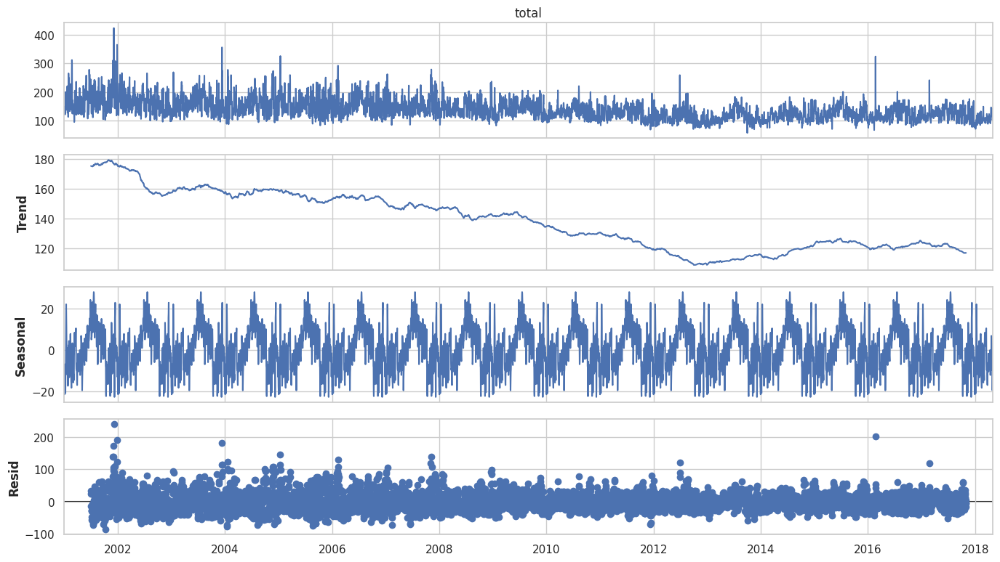

In [141]:
# Plot Components
decomp_air_qual_tot_daily = seasonal_decompose(prepro_stat_daily_df["total"], model='additive', period=365)
fig = decomp_air_qual_tot_daily.plot()
fig.set_size_inches((14, 8))
# Tight layout to realign things
fig.tight_layout()
plt.show()

<Axes: xlabel='ds'>

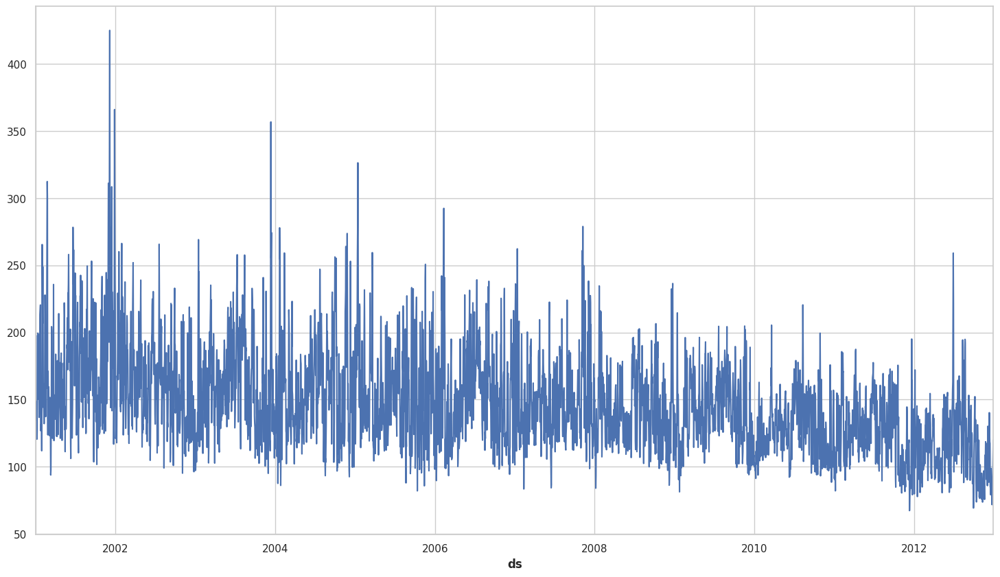

In [142]:
prepro_stat_daily_df["total"][:12*365].plot()

In [143]:
'''
# Plot Components
decomp_air_qual_tot_daily = seasonal_decompose(prepro_stat_daily_df["O_3_diff"], model='additive', period=31*6)
fig = decomp_air_qual_tot_daily.plot()
fig.set_size_inches((14, 8))
# Tight layout to realign things
fig.tight_layout()
plt.show()
'''

'\n# Plot Components\ndecomp_air_qual_tot_daily = seasonal_decompose(prepro_stat_daily_df["O_3_diff"], model=\'additive\', period=31*6)\nfig = decomp_air_qual_tot_daily.plot()\nfig.set_size_inches((14, 8))\n# Tight layout to realign things\nfig.tight_layout()\nplt.show()\n'

# Split Dataset

In [144]:
def run_partition_data(df, train_ratio=0.6, val_ratio=0.2, test_ratio=None):
    """
    Splits a given dataset of multiple time series into training, validation, and test sets based on the specified ratios.
    The data is transformed into time series format using the `TimeSeries.from_dataframe` method.

    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame where the index is the time ('ds') and each column represents a different time series.
        Each column corresponds to a specific time series (e.g., 'EBE', 'TOL', 'BEN', etc.).

    train_ratio : float, optional, default=0.6
        The proportion of the dataset to be used for the training set. The value must be between 0 and 1.

    val_ratio : float, optional, default=0.2
        The proportion of the dataset to be used for the validation set. The value must be between 0 and 1.

    test_ratio : float, optional, default=None
        The proportion of the dataset to be used for the test set. If None, the remaining data after
        splitting into train and validation sets will be used for testing.

    Returns:
    --------
    dict : dictionary
        A dictionary where the keys are the time series identifiers (e.g., 'EBE', 'TOL', etc.) and the values
        are tuples containing TimeSeries objects for the training, validation, and test sets for each time series.

    Notes:
    ------
    - The dataset must have a datetime index (`ds`) and each column represents a time series.
    """

    # Check if DataFrame is empty
    if df.empty:
        raise ValueError("The input dataframe is empty!")

    # Validate that the dataframe contains a datetime index
    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("DataFrame index must be of type DatetimeIndex.")

    # Normalize ratios if no test_ratio is given
    if test_ratio is None:
        test_ratio = 1 - (train_ratio + val_ratio)

    # Check if the sum of the ratios is less than or equal to 1
    if train_ratio + val_ratio + test_ratio > 1:
        raise ValueError("The sum of train_ratio, val_ratio, and test_ratio cannot exceed 1.")

    # Create a dictionary to store the TimeSeries splits for each series
    time_series_dict = {}

    # Get the number of rows in the dataset (this corresponds to the length of each time series)
    dataset_length = len(df)

    # Calculate split indices
    train_size = int(dataset_length * train_ratio)
    valid_size = int(dataset_length * val_ratio)
    test_size = dataset_length - (train_size + valid_size)

    index_name = 'ds'
    target_name = 'y'
    # Iterate over each column (time series) in the dataframe
    for feature in df.columns:
        # Split the data for the current time series
        series_data = df[[feature]]
        series_data.rename(columns={feature: target_name}, inplace=True)
        series_data = series_data.reset_index()

        # Split the series into train, validation, and test sets
        train = series_data[:train_size]
        valid = series_data[train_size:train_size + valid_size]
        test = series_data[train_size + valid_size:]

        # Convert pandas Series into TimeSeries objects for each split
        train_ts = TimeSeries.from_dataframe(train, time_col=index_name, value_cols=target_name)
        valid_ts = TimeSeries.from_dataframe(valid, time_col=index_name, value_cols=target_name)
        test_ts = TimeSeries.from_dataframe(test, time_col=index_name, value_cols=target_name)

        # Store the TimeSeries splits in the dictionary
        time_series_dict[feature] = (train_ts, valid_ts, test_ts)

    return time_series_dict


In [145]:
%%time
# Get partition
ts_daily_dict = run_partition_data(prepro_stat_daily_df, train_ratio=0.8, val_ratio=0.1)

CPU times: user 69.5 ms, sys: 366 μs, total: 69.9 ms
Wall time: 69.4 ms


In [146]:
# Review Total
train_ts, valid_ts, test_ts = ts_daily_dict['total']
print(f"Train: {train_ts.pd_dataframe().shape}")
print(f"Valid: {valid_ts.pd_dataframe().shape}")
print(f"Test : {test_ts.pd_dataframe().shape}")

print(f"Train: {len(train_ts)/len(prepro_stat_daily_df)}")
print(f"Valid: {len(valid_ts)/len(prepro_stat_daily_df)}")
print(f"Test : {len(test_ts)/len(prepro_stat_daily_df)}")

Train: (5064, 1)
Valid: (633, 1)
Test : (633, 1)
Train: 0.8
Valid: 0.1
Test : 0.1


In [147]:
# Print sample
train_ts.pd_dataframe().head(5).reset_index().to_dict('records')

[{'ds': Timestamp('2001-01-01 00:00:00'), 'y': 135.58869575382738},
 {'ds': Timestamp('2001-01-02 00:00:00'), 'y': 134.733041635997},
 {'ds': Timestamp('2001-01-03 00:00:00'), 'y': 145.10107388298434},
 {'ds': Timestamp('2001-01-04 00:00:00'), 'y': 141.6769632857102},
 {'ds': Timestamp('2001-01-05 00:00:00'), 'y': 148.4710177011618}]

In [148]:
# Print sample
valid_ts.pd_dataframe().head(5)

component,y
ds,
2014-11-13,99.079565
2014-11-14,98.358687
2014-11-15,90.192631
2014-11-16,85.751690
2014-11-17,106.042941


In [149]:
# Print sample
test_ts.pd_dataframe().head(5)

component,y
ds,
2016-08-07,112.700823
2016-08-08,136.980930
2016-08-09,137.141685
2016-08-10,99.918606
2016-08-11,118.588795


# Preprocessing

In [150]:
def run_transformation(ts_dict: pd.DataFrame):
    # Tranformation
    ts_scaled_dict = {}
    for feature, (train_ts, valid_ts, test_ts) in ts_dict.items():
       transform_i = Scaler()
       train_ts_scaled_i = transform_i.fit_transform(train_ts)
       valid_ts_scaled_i = transform_i.transform(valid_ts)
       test_ts_scaled_i  = transform_i.transform(test_ts)
       ts_scaled_dict[feature] = (transform_i, train_ts_scaled_i, valid_ts_scaled_i, test_ts_scaled_i)

    return ts_scaled_dict

In [151]:
ts_daily_scaled_dict = run_transformation(ts_daily_dict)

In [152]:
# Review Total
transform, train_ts_scaled, valid_ts_scaled, test_ts_scaled = ts_daily_scaled_dict['total']
print(train_ts_scaled.pd_dataframe().head(5))
print(valid_ts_scaled.pd_dataframe().head(5))
print(test_ts_scaled.pd_dataframe().head(5))

component          y
ds                  
2001-01-01  0.216770
2001-01-02  0.214454
2001-01-03  0.242519
2001-01-04  0.233250
2001-01-05  0.251641
component          y
ds                  
2014-11-13  0.117946
2014-11-14  0.115995
2014-11-15  0.093890
2014-11-16  0.081869
2014-11-17  0.136795
component          y
ds                  
2016-08-07  0.154816
2016-08-08  0.220539
2016-08-09  0.220974
2016-08-10  0.120217
2016-08-11  0.170754


<Axes: xlabel='ds'>

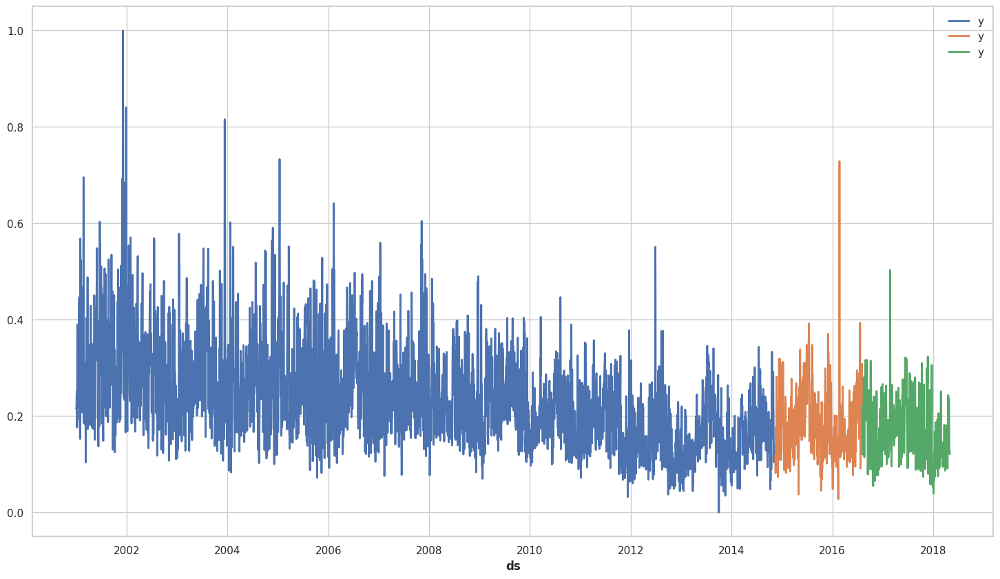

In [153]:
train_ts_scaled.plot()
valid_ts_scaled.plot()
test_ts_scaled.plot()

In [154]:
# Review Total
train_ts, valid_ts, test_ts = ts_daily_dict['EBE']
print(train_ts.pd_dataframe().head(5))
print(valid_ts.pd_dataframe().head(5))
print(test_ts.pd_dataframe().head(5))

component          y
ds                  
2001-01-01  3.419470
2001-01-02  2.484133
2001-01-03  3.331298
2001-01-04  3.164335
2001-01-05  5.354447
component          y
ds                  
2014-11-13  0.752319
2014-11-14  0.441580
2014-11-15  0.176873
2014-11-16  0.137190
2014-11-17  0.545300
component          y
ds                  
2016-08-07  0.156262
2016-08-08  0.232006
2016-08-09  0.350632
2016-08-10  0.176780
2016-08-11  0.158960


In [155]:
# Review Total
transform, train_ts_scaled, valid_ts_scaled, test_ts_scaled = ts_daily_scaled_dict['EBE']
print(train_ts_scaled.pd_dataframe().head(5))
print(valid_ts_scaled.pd_dataframe().head(5))
print(test_ts_scaled.pd_dataframe().head(5))

component          y
ds                  
2001-01-01  0.266294
2001-01-02  0.191128
2001-01-03  0.259209
2001-01-04  0.245791
2001-01-05  0.421794
component          y
ds                  
2014-11-13  0.051955
2014-11-14  0.026983
2014-11-15  0.005710
2014-11-16  0.002521
2014-11-17  0.035318
component          y
ds                  
2016-08-07  0.004054
2016-08-08  0.010141
2016-08-09  0.019674
2016-08-10  0.005703
2016-08-11  0.004271


In [156]:
print(transform.inverse_transform(train_ts_scaled).pd_dataframe().head(5))
print(transform.inverse_transform(valid_ts_scaled).pd_dataframe().head(5))
print(transform.inverse_transform(test_ts_scaled).pd_dataframe().head(5))

component          y
ds                  
2001-01-01  3.419470
2001-01-02  2.484133
2001-01-03  3.331298
2001-01-04  3.164335
2001-01-05  5.354447
component          y
ds                  
2014-11-13  0.752319
2014-11-14  0.441580
2014-11-15  0.176873
2014-11-16  0.137190
2014-11-17  0.545300
component          y
ds                  
2016-08-07  0.156262
2016-08-08  0.232006
2016-08-09  0.350632
2016-08-10  0.176780
2016-08-11  0.158960


# Training

https://github.com/unit8co/darts/blob/gh-pages/examples/03-FFT-examples.ipynb


https://medium.com/spikelab/time-series-parameters-finding-using-prophet-and-optuna-bayesian-optimization-e618614bd8b7


https://plotly.com/python/templates/

https://medium.com/@markwkiehl/optimize-darts-tfm-with-backtesting-7a20340fb991

https://towardsdatascience.com/demand-forecasting-with-darts-a-tutorial-480ba5c24377



https://umeshk1255.medium.com/darts-learn-how-to-simply-perform-time-series-analysis-and-forecasting-in-deep-neural-networks-ff868775392c

In [157]:
def display_forecast(pred_series, ts_transformed, start_date=None):
    plt.figure(figsize=(8, 5))
    if start_date:
        ts_transformed = ts_transformed.drop_before(start_date)
    ts_transformed.univariate_component(0).plot(label="actual")
    pred_series.plot(label=("historic forecasts"))
    val_mae = mae(ts_transformed, pred_series)
    val_rmse = rmse(ts_transformed, pred_series)
    val_mape = mape(ts_transformed, pred_series)
    val_r2_score = r2_score(ts_transformed.univariate_component(0), pred_series)
    plt.title(f"R2: {val_r2_score:.3f}, MAE: {val_mae:.3f}, RMSE: {val_rmse:.3f}, MAPE: {val_mape:.3f},")
    plt.legend()

In [158]:
def read_model_parms(path: str) -> Dict[str, Any]:
    """
    Reads a JSON file and returns its content as a dictionary.

    :param path: Path to the JSON file.
    :return: Dictionary with the JSON content.
    """
    try:
        with open(path, 'r', encoding='utf-8') as file:
            return json.load(file)
    except (FileNotFoundError, json.JSONDecodeError) as e:
        raise ValueError(f"Error reading JSON: {e}")

In [159]:
def build_model_params(
    optimized_params_path: str,
    default_params: Optional[Dict[str, Any]] = None
) -> Dict[str, Any]:
    """
    Reads a JSON file and merges its content with a dictionary of default values.
    If there are duplicate keys, the values from the JSON take precedence.

    :param optimized_params_path: Path to the JSON file.
    :param default_values: Dictionary with default values (optional).
    :return: Dictionary with the merged values.
    """
    optimized_params = read_model_parms(optimized_params_path)

    if default_params is None:
        return optimized_params

    # Merge dictionaries, giving priority to the JSON
    combined_params = {**default_params, **optimized_params}
    return combined_params

In [160]:
def run_predict(
    model,
    series_ts: TimeSeries,
    test_ts: TimeSeries,
    horizont: int = 7,
    stride: int = 7,
    transform: Optional[Scaler] = None,
):
    # Make predictions
    forecast = model.historical_forecasts(
        series=series_ts,
        forecast_horizon=horizont,
        stride=stride,
        start=test_ts.start_time(),
        #last_points_only=True,  # returns a single TimeSeries
        last_points_only=False,
        retrain=False,
        verbose=True,
    )
    forecast = concatenate(forecast)

In [161]:
def run_evaluate_model(
    model,
    series_ts: TimeSeries,
    test_ts: TimeSeries,
    horizont: int = 7,
    stride: int = 7,
    transform: Optional[Scaler] = None,
):
    # concatenate cal and test set to be able to start forecasting at the `test` start time
    all_series_ts = concatenate([series_ts, test_ts], axis=0)

    # Make predictions
    forecast = model.historical_forecasts(
        series=all_series_ts,
        forecast_horizon=horizont,
        stride=stride,
        start=test_ts.start_time(),
        #last_points_only=True,  # returns a single TimeSeries
        last_points_only=False,
        retrain=False,
        verbose=True,
    )
    forecast = concatenate(forecast)

    # Metrics
    val_mae = mae(test_ts, forecast)
    val_rmse = rmse(test_ts, forecast)
    val_mape = mape(test_ts, forecast)
    #val_r2_score = r2_score(test_ts.univariate_component(0), forecast)

    # Transform
    forecast_back = None
    if transform:
        logger.info('transform forecast')
        forecast_back = transform.inverse_transform(forecast)
        #forecast = transform.inverse_transform(forecast)
        #test_ts = transform.inverse_transform(test_ts)

    # Return
    return {
        'forecast': forecast,
        'forecast_back': forecast_back,
        'metrics': {
          'mae': val_mae,
          'rmse': val_rmse,
          'mape': val_mape,
          #'r2_score': val_r2_score,
        }
    }


In [162]:
def run_traininig(
    df_train,
    df_valid,
    df_test,
    trainer,
    model_params: dict,
    model_name: str,
    models_dir:str,
    transform = None,
):
    # Train model
    model_params['model_name'] = model_name
    trained_result = trainer(
        df_train,
        df_valid,
        model_params,
        transform,
    )

    # Save Metrics
    metrics_train = trained_result['metrics']
    logger.info(f"[RUN-TRAINING] Train Metrics: {metrics_train}")
    metrics_eval_path = os.path.join(models_dir, f'{model_name}_eval_valid.json')
    with open(metrics_eval_path, 'w') as f:
        json.dump(metrics_train, f)

    # Save Model
    model = trained_result['model']
    model_path = os.path.join(models_dir, f'{model_name}.pt')
    model.save(model_path)

    # Save forecast
    forecast = trained_result['forecast']
    forecast_path = os.path.join(models_dir, f'{model_name}_forecast_valid.csv')
    forecast.pd_dataframe().to_csv(forecast_path)
    forecast_back = trained_result['forecast_back']
    forecast_back_path = os.path.join(models_dir, f'{model_name}_forecast_valid_back.csv')
    forecast_back.pd_dataframe().to_csv(forecast_back_path)

    # Evaluation Base Random Forest
    eval_results = run_evaluate_model(
        model,
        df_valid,
        df_test,
        transform=transform
    )

    # Save Metrics
    metrics_eval = eval_results['metrics']
    logger.info(f"[RUN-TRAINING] Test Metrics: {metrics_eval}")
    metrics_eval_path = os.path.join(models_dir, f'{model_name}_eval_test.json')
    with open(metrics_eval_path, 'w') as f:
        json.dump(metrics_eval, f)

    # Save forecast
    forecast_eval = eval_results['forecast']
    forecast_eval_path = os.path.join(models_dir, f'{model_name}_forecast_test.csv')
    forecast_eval.pd_dataframe().to_csv(forecast_eval_path)
    forecast_eval_back = eval_results['forecast_back']
    forecast_eval_back_path = os.path.join(models_dir, f'{model_name}_forecast_test_back.csv')
    forecast_eval_back.pd_dataframe().to_csv(forecast_eval_back_path)


In [163]:
def run_optimization(
    train_ts,
    valid_ts,
    optimizer,
    default_params,
    model_name,
    models_dir,
    transform,
    n_trials=50,
):
    # Optimize
    optimize_results = optimizer(
        train_ts,
        valid_ts,
        transform=transform,
        experiment_name=model_name,
        n_trials=n_trials,
        default_params=default_params
    )
    # Retrive best parametres
    best_opt_params = optimize_results['best_params']
    logger.info(f"[OPIMIZATION] Best params: {best_opt_params}")

    best_params = {**default_params, **best_opt_params}
    logger.info(f"[OPIMIZATION] Best params: {best_params}")

    # Save best parameters
    best_params_file = os.path.join(models_dir, f'{model_name}_optimized_params.json')
    with open(best_params_file, 'w') as f:
        json.dump(best_params, f)

## TCNModel

https://unit8co.github.io/darts/examples/17-hyperparameter-optimization.html#Build-a-Simple-TCN-Model


### Baseline model

In [164]:
def train_tcn(
    train,
    valid,
    params:dict={},
    transform=None
):
    # Preprocessing
    logger.info(f'[TCN] params: {params}')

    # reproducibility
    torch.manual_seed(42)

    # some fixed parameters that will be the same for all models
    MAX_SAMPLES_PER_TS = 60

    # throughout training we'll monitor the validation loss for early stopping
    early_stopper = EarlyStopping(
        "val_loss",
        min_delta=0.001, patience=5,
        verbose=True
    )
    if 'callbacks' in params:
      callbacks = [early_stopper] + params['callbacks']
      del params['callbacks']
    else:
      callbacks = [early_stopper]

    # detect if a GPU is available
    if torch.cuda.is_available():
        pl_trainer_kwargs = {
            "accelerator": "gpu",
            "gpus": -1,
            "auto_select_gpus": True,
            "callbacks": callbacks,
        }
        num_workers = 4
    else:
        pl_trainer_kwargs = {"callbacks": callbacks}
        num_workers = 0

    # Check learning rate
    if 'learning_rate' in params:
      params['optimizer_kwargs'] = {'lr': params['learning_rate']}
      del params['learning_rate']

    # optionally also add the day of the week (cyclically encoded) as a past covariate
    #encoders = {"cyclic": {"past": ["dayofweek"]}} if include_dayofweek else None
    if 'include_dayofweek' in params:
      encoders = {"cyclic": {"past": ["dayofweek"]}}
      params['add_encoders'] = encoders
      del params['include_dayofweek']


    # build the TCN model
    model = TCNModel(
        **params
    )

    # train the model
    model.fit(
        series=train,
        val_series=valid,
        max_samples_per_ts=MAX_SAMPLES_PER_TS,
        dataloader_kwargs={"num_workers": num_workers},
    )

    # Reload best model over course of training
    model = TCNModel.load_from_checkpoint(params['model_name'])

    # Predict
    eval_valid = run_evaluate_model(
        model,
        train,
        valid,
        horizont=7,
        stride=7,
        transform=transform
    )

    train_result = {'model': model}
    return {**train_result, **eval_valid}

In [165]:
# Setting
#BASE_MODEL_NAME_TCN = 'base_tcn_model'
#BATCH_SIZE = 1024
MAX_N_EPOCHS = 20
NR_EPOCHS_VAL_PERIOD = 1
MAX_SAMPLES_PER_TS = 1000
BASE_LR_TCN = 1e-4
RANDOM_SEED = 42
base_params_tcn = {
    'input_chunk_length': 230,
    'output_chunk_length': 16,
    'kernel_size': 5,
    'num_filters': 5,
    'weight_norm': False,
    'dilation_base': 2,
    'dropout': 0.2,
    'learning_rate': BASE_LR_TCN,
    'include_dayofweek': False,
    'n_epochs': MAX_N_EPOCHS,
    # Save model
    'random_state': RANDOM_SEED,
    'model_name': BASELINE_MODEL_NAME_TCN,
    'force_reset':True,
    'save_checkpoints':True,
    'log_tensorboard': True
}
base_params_tcn

{'input_chunk_length': 230,
 'output_chunk_length': 16,
 'kernel_size': 5,
 'num_filters': 5,
 'weight_norm': False,
 'dilation_base': 2,
 'dropout': 0.2,
 'learning_rate': 0.0001,
 'include_dayofweek': False,
 'n_epochs': 20,
 'random_state': 42,
 'model_name': 'baseline_model_tcn',
 'force_reset': True,
 'save_checkpoints': True,
 'log_tensorboard': True}

In [166]:
ts_daily_scaled_dict.keys()

dict_keys(['EBE', 'TOL', 'BEN', 'NMHC', 'TCH', 'CO', 'SO_2', 'PM10', 'O_3', 'NO_2', 'total'])

In [167]:
# Review Total
# NOx	0.376015
# CO	0.303872
# SO_2	0.271062
# PM10	0.248664
# O_3	0.214402
# NO_2
ts_name = 'total'
train_ts, valid_ts, test_ts = ts_daily_dict[ts_name]
transform, train_ts_scaled, valid_ts_scaled, test_ts_scaled = ts_daily_scaled_dict[ts_name]

In [168]:
%%time
# Train with TCN: Base model
'''
base_trained_tcn = train_tcn(
    train_ts_scaled,
    valid_ts_scaled,
    params=base_params_tcn,
    transform=transform
)
'''
run_traininig(
    train_ts_scaled,
    valid_ts_scaled,
    test_ts_scaled,
    trainer=train_tcn,
    model_params=base_params_tcn,
    model_name=BASELINE_MODEL_NAME_TCN,
    models_dir=TCN_MODELS_DIR,
    transform = transform
)


2025-02-03 18:50:05 - INFO - [TCN] params: {'input_chunk_length': 230, 'output_chunk_length': 16, 'kernel_size': 5, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 2, 'dropout': 0.2, 'learning_rate': 0.0001, 'include_dayofweek': False, 'n_epochs': 20, 'random_state': 42, 'model_name': 'baseline_model_tcn', 'force_reset': True, 'save_checkpoints': True, 'log_tensorboard': True}
2025-02-03 18:50:05 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:05 - INFO - Number of layers chosen: 5
2025-02-03 18:50:05 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | tr

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=20` reached.
2025-02-03 18:50:07 - INFO - loading best-epoch=19-val_loss=0.01.ckpt
2025-02-03 18:50:07 - INFO - Number of layers chosen: 5
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:07 - INFO - transform forecast
2025-02-03 18:50:07 - INFO - [RUN-TRAINING] Train Metrics: {'mae': 0.0803398430050766, 'rmse': 0.10031729537697257, 'mape': 43.343844068170256}
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:08 - INFO - transform forecast
2025-02-03 18:50:08 - INFO - [RUN-TRAINING] Test Metrics: {'mae': 0.07474048950334089, 'rmse': 0.0916764551482709, 'mape': 43.476301630922336}


CPU times: user 4.32 s, sys: 282 ms, total: 4.61 s
Wall time: 2.89 s


In [169]:
!ls -lh "darts_logs/base_tcn_model"
!ls -lh "{TCN_MODELS_DIR}"

ls: cannot access 'darts_logs/base_tcn_model': No such file or directory
total 1.2M
-rw-rw-rw- 1 codespace codespace 444K Feb  3 18:50 baseline_model_tcn.pt
-rw------- 1 codespace codespace  23K Feb  3 18:50 baseline_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_test.json
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_valid.json
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_test.csv
-rw-rw-rw- 1 codespace codespace  18K Feb  3 18:50 baseline_model_tcn_forecast_test_back.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid_back.csv
-rw-rw-rw- 1 codespace codespace 372K Feb  3 18:44 best_model_tcn.pt
-rw------- 1 codespace codespace 189K Feb  3 18:44 best_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   85 Feb  3 18:44 best_model_tcn_eval_test.json
-rw-rw

In [170]:
!cat "{TCN_MODELS_DIR}/{BASELINE_MODEL_NAME_TCN}_eval_valid.json"

{"mae": 0.0803398430050766, "rmse": 0.10031729537697257, "mape": 43.343844068170256}

In [171]:
!cat "{TCN_MODELS_DIR}/{BASELINE_MODEL_NAME_TCN}_eval_test.json"

{"mae": 0.07474048950334089, "rmse": 0.0916764551482709, "mape": 43.476301630922336}

In [172]:
#%tensorboard --logdir darts_logs/base_tcn_model/logs

In [173]:
# Retrieve results
'''
base_model_tcn = base_trained_tcn["model"]
base_forecast_ts_tcn = base_trained_tcn["forecast"]
base_metrics_tcn = base_trained_tcn['metrics']
'''

# Read model
print(f"[TCN] Metric  : {BASELINE_MODEL_TCN_FILE}")
baseline_model_tcn = TCNModel.load(BASELINE_MODEL_TCN_FILE)
# Read Metrics
print(f"[TCN] Metric  : {BASELINE_VALID_EVAL_TCN_FILE}")
baseline_metrics_tcn = read_model_parms(BASELINE_VALID_EVAL_TCN_FILE)
print(f"[TCN] Metric  : {baseline_metrics_tcn}")
# Read Forecast
print(f"[TCN] Forecast: {BASELINE_VALID_FORECAST_TCN_FILE}")
baseline_valid_forecast_ts_nbeats = TimeSeries.from_csv(BASELINE_VALID_FORECAST_TCN_FILE, time_col='ds')

2025-02-03 18:50:09 - INFO - Number of layers chosen: 5


[TCN] Metric  : ../models/notebook_tcn/baseline_model_tcn.pt
[TCN] Metric  : ../models/notebook_tcn/baseline_model_tcn_eval_valid.json
[TCN] Metric  : {'mae': 0.0803398430050766, 'rmse': 0.10031729537697257, 'mape': 43.343844068170256}
[TCN] Forecast: ../models/notebook_tcn/baseline_model_tcn_forecast_valid.csv


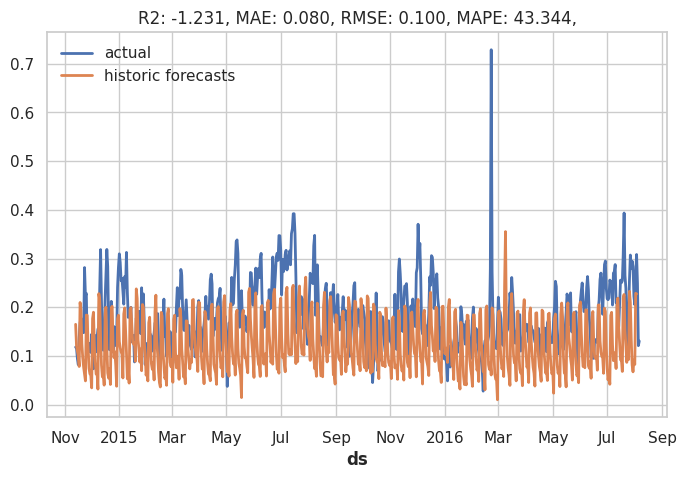

In [174]:
display_forecast(baseline_valid_forecast_ts_nbeats, valid_ts_scaled, start_date=None)

In [175]:
%%time
'''
# concatenate cal and test set to be able to start forecasting at the `test` start time
val_test_ts_scaled = concatenate([valid_ts_scaled, test_ts_scaled], axis=0)

horizon = len(test_ts)
base_pred_test_scaled_tcn = base_model_tcn.historical_forecasts(
    series=val_test_ts_scaled,
    forecast_horizon=7,
    stride=7,
    start=test_ts.start_time(),
    #last_points_only=True,  # returns a single TimeSeries
    last_points_only=False,
    retrain=False,
    verbose=True,
)
base_pred_test_scaled_tcn = concatenate(base_pred_test_scaled_tcn)
base_pred_test_ts_tcn = transform.inverse_transform(base_pred_test_scaled_tcn)

base_pred_test_ts_tcn.shape, test_ts.shape
'''

baseline_eval_test_tcn = run_evaluate_model(
    baseline_model_tcn,
    valid_ts_scaled,
    test_ts_scaled,
    horizont = 7,
    stride = 7,
    transform = transform
)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:10 - INFO - transform forecast


CPU times: user 283 ms, sys: 22 ms, total: 305 ms
Wall time: 251 ms


In [176]:
# Get forecast and metrics
baseline_test_forecast_ts_tcn = baseline_eval_test_tcn["forecast"]
baseline_test_forecast_ts_back_tcn = baseline_eval_test_tcn["forecast_back"]
baseline_test_metrics_tcn = baseline_eval_test_tcn['metrics']
print(f"[TCN] Metrics TEST: {baseline_test_metrics_tcn}")

[TCN] Metrics TEST: {'mae': 0.07474048950334089, 'rmse': 0.0916764551482709, 'mape': 43.476301630922336}


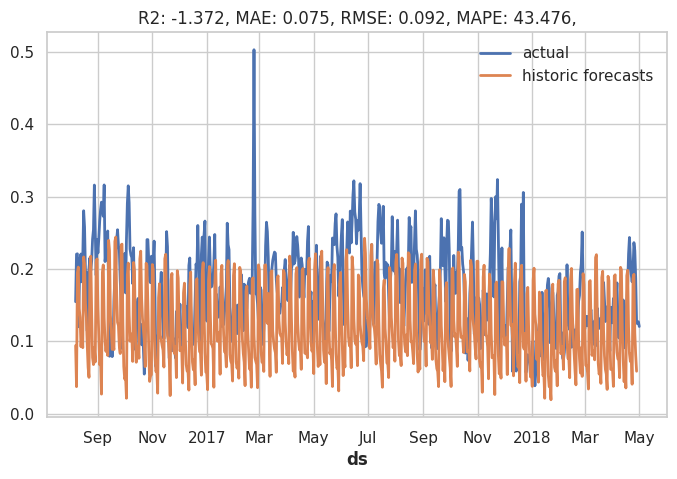

In [177]:
#base_pred_test_ts.plot(label='forecast')
#test_ts.plot(label='actual')
display_forecast(baseline_test_forecast_ts_tcn, test_ts_scaled, start_date=None)

In [178]:
!ls -lh "{TCN_MODELS_DIR}"

total 1.2M
-rw-rw-rw- 1 codespace codespace 444K Feb  3 18:50 baseline_model_tcn.pt
-rw------- 1 codespace codespace  23K Feb  3 18:50 baseline_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_test.json
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_valid.json
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_test.csv
-rw-rw-rw- 1 codespace codespace  18K Feb  3 18:50 baseline_model_tcn_forecast_test_back.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid_back.csv
-rw-rw-rw- 1 codespace codespace 372K Feb  3 18:44 best_model_tcn.pt
-rw------- 1 codespace codespace 189K Feb  3 18:44 best_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   85 Feb  3 18:44 best_model_tcn_eval_test.json
-rw-rw-rw- 1 codespace codespace   85 Feb  3 18:44 best_model_tcn_eval_valid.js

### Hyperparameter Tuning

In [179]:
# Función para optimización usando Optuna
def optimize_tcn_with_optuna(
    train_ts,
    valid_ts,
    transform,
    experiment_name='tcn_model',
    n_trials=50,
    #n_epochs=100,
    #random_seed=42
    default_params:dict=None
):
    # Función objetivo para Optuna
    def objective(trial):
        input_chunk_length = trial.suggest_int('input_chunk_length', 24, 60)
        output_chunk_length = trial.suggest_int('output_chunk_length', 12, 24)
        num_filters = trial.suggest_int('num_filters', 32, 256)
        kernel_size = trial.suggest_int('kernel_size', 2, 8)
        dropout = trial.suggest_uniform('dropout', 0.0, 0.5)
        batch_size = trial.suggest_int('batch_size', 16, 128)
        learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)

        model_name = f"{experiment_name}_trial_{trial.number}"
        trial_params = {
            'input_chunk_length': input_chunk_length,
            'output_chunk_length': output_chunk_length,
            'num_filters': num_filters,
            'kernel_size': kernel_size,
            'dropout': dropout,
            'batch_size': batch_size,
            'learning_rate': learning_rate,
            #'optimizer_kwargs': {'lr': learning_rate},
            #'n_epochs': n_epochs,
            #'random_state': random_seed,
            # Model Name
            'model_name': model_name,
            'force_reset':True,
            'save_checkpoints':True,
        }
        if default_params:
          trial_params = {**default_params, **trial_params}

        # Evaluación con historical_forecasts
        #model = train_nbeats_model(series_scaled, input_chunk_length, output_chunk_length, num_blocks, thetas_dim, hidden_layer_units, dropout, learning_rate)
        results = train_tcn(
            train_ts,
            valid_ts,
            trial_params,
            transform
        )
        scores = results['metrics']
        error = scores['rmse']

        return error

    study = optuna.create_study(direction='minimize')
    study.optimize(lambda trial: objective(trial), n_trials=n_trials)

    return {
        'best_params': study.best_params,
        'results': study.trials
    }


In [180]:
# Setting
#BEST_MODEL_NAME_TCN = 'best_model_tcn'
MAX_TRIALS = 10
MAX_N_EPOCHS = 10
RANDOM_SEED = 42
default_params_tcn = {
    'n_epochs': MAX_N_EPOCHS,
    'random_state': RANDOM_SEED,
    # Save model
    'model_name': HPO_MODEL_NAME_TCN,
    'force_reset':True,
    'save_checkpoints':True,
}
default_params_tcn

{'n_epochs': 10,
 'random_state': 42,
 'model_name': 'hpo_model_tcn',
 'force_reset': True,
 'save_checkpoints': True}

In [181]:
%%time
# Optimize with TCN
'''
optimize_results_tcn = optimize_tcn_with_optuna(
    train_ts_scaled,
    valid_ts_scaled,
    transform,
    n_trials=2,
    n_epochs=MAX_N_EPOCHS,
    random_seed=RANDOM_SEED
)
'''
run_optimization(
    train_ts_scaled,
    valid_ts_scaled,
    optimizer=optimize_tcn_with_optuna,
    default_params=default_params_tcn,
    model_name=HPO_MODEL_NAME_TCN,
    models_dir=TCN_MODELS_DIR,
    transform=transform,
    n_trials=MAX_TRIALS,
    #n_epochs=MAX_N_EPOCHS,
    #random_seed=RANDOM_SEED
)

[I 2025-02-03 18:50:11,610] A new study created in memory with name: no-name-1797e6d9-9463-45ed-ae90-96ed3fc1e215
2025-02-03 18:50:11 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_0', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 25, 'output_chunk_length': 12, 'num_filters': 217, 'kernel_size': 3, 'dropout': 0.044614478230579346, 'batch_size': 92, 'learning_rate': 1.5782008577424157e-05}
2025-02-03 18:50:11 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:11 - INFO - Number of layers chosen: 3
2025-02-03 18:50:11 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0  

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:50:16 - INFO - loading best-epoch=9-val_loss=0.09.ckpt
2025-02-03 18:50:16 - INFO - Number of layers chosen: 3
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:17 - INFO - transform forecast
[I 2025-02-03 18:50:17,194] Trial 0 finished with value: 0.16127937876056908 and parameters: {'input_chunk_length': 25, 'output_chunk_length': 12, 'num_filters': 217, 'kernel_size': 3, 'dropout': 0.044614478230579346, 'batch_size': 92, 'learning_rate': 1.5782008577424157e-05}. Best is trial 0 with value: 0.16127937876056908.
2025-02-03 18:50:17 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_1', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 34, 'output_chunk_length': 16, 'num_filters': 151, 'kernel_size': 7, 'dropout': 0.1729584079845205, 'batch_size': 111, 'learning_rate': 0.00017428495407875315}
2025-02-03 18:50:17 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:17 - INFO - Number of layers chosen: 2
2025-02-03 18:50:17 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU c

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:50:20 - INFO - loading best-epoch=9-val_loss=0.00.ckpt
2025-02-03 18:50:20 - INFO - Number of layers chosen: 2
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:20 - INFO - transform forecast
[I 2025-02-03 18:50:20,466] Trial 1 finished with value: 0.09564284866884044 and parameters: {'input_chunk_length': 34, 'output_chunk_length': 16, 'num_filters': 151, 'kernel_size': 7, 'dropout': 0.1729584079845205, 'batch_size': 111, 'learning_rate': 0.00017428495407875315}. Best is trial 1 with value: 0.09564284866884044.
2025-02-03 18:50:20 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_2', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 40, 'output_chunk_length': 19, 'num_filters': 66, 'kernel_size': 3, 'dropout': 0.4906115831561874, 'batch_size': 76, 'learning_rate': 0.0026150445480644766}
2025-02-03 18:50:20 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:20 - INFO - Number of layers chosen: 4
2025-02-03 18:50:20 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:50:22 - INFO - loading best-epoch=8-val_loss=0.00.ckpt
2025-02-03 18:50:22 - INFO - Number of layers chosen: 4
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:22 - INFO - transform forecast
[I 2025-02-03 18:50:22,929] Trial 2 finished with value: 0.07901978146476357 and parameters: {'input_chunk_length': 40, 'output_chunk_length': 19, 'num_filters': 66, 'kernel_size': 3, 'dropout': 0.4906115831561874, 'batch_size': 76, 'learning_rate': 0.0026150445480644766}. Best is trial 2 with value: 0.07901978146476357.
2025-02-03 18:50:22 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_3', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 45, 'output_chunk_length': 24, 'num_filters': 69, 'kernel_size': 7, 'dropout': 0.3652417804950274, 'batch_size': 65, 'learning_rate': 0.0002094250501926543}
2025-02-03 18:50:22 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:22 - INFO - Number of layers chosen: 3
2025-02-03 18:50:22 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HP

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:50:25 - INFO - loading best-epoch=9-val_loss=0.02.ckpt
2025-02-03 18:50:25 - INFO - Number of layers chosen: 3
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:25 - INFO - transform forecast
[I 2025-02-03 18:50:25,770] Trial 3 finished with value: 0.07169560558548474 and parameters: {'input_chunk_length': 45, 'output_chunk_length': 24, 'num_filters': 69, 'kernel_size': 7, 'dropout': 0.3652417804950274, 'batch_size': 65, 'learning_rate': 0.0002094250501926543}. Best is trial 3 with value: 0.07169560558548474.
2025-02-03 18:50:25 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_4', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 42, 'output_chunk_length': 21, 'num_filters': 131, 'kernel_size': 8, 'dropout': 0.446592378754293, 'batch_size': 53, 'learning_rate': 0.0012365223768169857}
2025-02-03 18:50:25 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:25 - INFO - Number of layers chosen: 2
2025-02-03 18:50:25 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HP

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:50:28 - INFO - loading best-epoch=9-val_loss=0.01.ckpt
2025-02-03 18:50:28 - INFO - Number of layers chosen: 2
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:29 - INFO - transform forecast
[I 2025-02-03 18:50:29,260] Trial 4 finished with value: 0.06811086957712302 and parameters: {'input_chunk_length': 42, 'output_chunk_length': 21, 'num_filters': 131, 'kernel_size': 8, 'dropout': 0.446592378754293, 'batch_size': 53, 'learning_rate': 0.0012365223768169857}. Best is trial 4 with value: 0.06811086957712302.
2025-02-03 18:50:29 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_5', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 47, 'output_chunk_length': 23, 'num_filters': 75, 'kernel_size': 5, 'dropout': 0.23121382712562433, 'batch_size': 89, 'learning_rate': 1.5470592430360648e-05}
2025-02-03 18:50:29 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:29 - INFO - Number of layers chosen: 3
2025-02-03 18:50:29 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:50:31 - INFO - loading best-epoch=9-val_loss=0.01.ckpt
2025-02-03 18:50:31 - INFO - Number of layers chosen: 3
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:31 - INFO - transform forecast
[I 2025-02-03 18:50:31,894] Trial 5 finished with value: 0.07626320535550679 and parameters: {'input_chunk_length': 47, 'output_chunk_length': 23, 'num_filters': 75, 'kernel_size': 5, 'dropout': 0.23121382712562433, 'batch_size': 89, 'learning_rate': 1.5470592430360648e-05}. Best is trial 4 with value: 0.06811086957712302.
2025-02-03 18:50:31 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_6', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 55, 'output_chunk_length': 23, 'num_filters': 199, 'kernel_size': 6, 'dropout': 0.04060131954997992, 'batch_size': 32, 'learning_rate': 1.4183224119299058e-05}
2025-02-03 18:50:31 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:31 - INFO - Number of layers chosen: 3
2025-02-03 18:50:31 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cor

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:50:41 - INFO - loading best-epoch=9-val_loss=0.01.ckpt
2025-02-03 18:50:41 - INFO - Number of layers chosen: 3
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:42 - INFO - transform forecast
[I 2025-02-03 18:50:42,500] Trial 6 finished with value: 0.07190046097491355 and parameters: {'input_chunk_length': 55, 'output_chunk_length': 23, 'num_filters': 199, 'kernel_size': 6, 'dropout': 0.04060131954997992, 'batch_size': 32, 'learning_rate': 1.4183224119299058e-05}. Best is trial 4 with value: 0.06811086957712302.
2025-02-03 18:50:42 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_7', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 31, 'output_chunk_length': 17, 'num_filters': 153, 'kernel_size': 3, 'dropout': 0.1703540672644469, 'batch_size': 118, 'learning_rate': 1.1220110317651784e-05}
2025-02-03 18:50:42 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:42 - INFO - Number of layers chosen: 4
2025-02-03 18:50:42 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU co

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:50:47 - INFO - loading best-epoch=9-val_loss=0.01.ckpt
2025-02-03 18:50:47 - INFO - Number of layers chosen: 4
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:48 - INFO - transform forecast
[I 2025-02-03 18:50:48,402] Trial 7 finished with value: 0.07106374010454491 and parameters: {'input_chunk_length': 31, 'output_chunk_length': 17, 'num_filters': 153, 'kernel_size': 3, 'dropout': 0.1703540672644469, 'batch_size': 118, 'learning_rate': 1.1220110317651784e-05}. Best is trial 4 with value: 0.06811086957712302.
2025-02-03 18:50:48 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_8', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 49, 'output_chunk_length': 16, 'num_filters': 190, 'kernel_size': 5, 'dropout': 0.25595131633525214, 'batch_size': 60, 'learning_rate': 4.3462402524316957e-05}
2025-02-03 18:50:48 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:48 - INFO - Number of layers chosen: 3
2025-02-03 18:50:48 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU co

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:50:55 - INFO - loading best-epoch=9-val_loss=0.01.ckpt
2025-02-03 18:50:55 - INFO - Number of layers chosen: 3
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:50:56 - INFO - transform forecast
[I 2025-02-03 18:50:56,054] Trial 8 finished with value: 0.10023979744787057 and parameters: {'input_chunk_length': 49, 'output_chunk_length': 16, 'num_filters': 190, 'kernel_size': 5, 'dropout': 0.25595131633525214, 'batch_size': 60, 'learning_rate': 4.3462402524316957e-05}. Best is trial 4 with value: 0.06811086957712302.
2025-02-03 18:50:56 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn_trial_9', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 40, 'output_chunk_length': 21, 'num_filters': 184, 'kernel_size': 2, 'dropout': 0.03373813232607825, 'batch_size': 37, 'learning_rate': 0.00012021884759967559}
2025-02-03 18:50:56 - INFO - Train dataset contains 60 samples.
2025-02-03 18:50:56 - INFO - Number of layers chosen: 5
2025-02-03 18:50:56 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU co

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:51:03 - INFO - loading best-epoch=7-val_loss=0.01.ckpt
2025-02-03 18:51:03 - INFO - Number of layers chosen: 5
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:51:03 - INFO - transform forecast
[I 2025-02-03 18:51:03,743] Trial 9 finished with value: 0.08431847106954347 and parameters: {'input_chunk_length': 40, 'output_chunk_length': 21, 'num_filters': 184, 'kernel_size': 2, 'dropout': 0.03373813232607825, 'batch_size': 37, 'learning_rate': 0.00012021884759967559}. Best is trial 4 with value: 0.06811086957712302.
2025-02-03 18:51:03 - INFO - [OPIMIZATION] Best params: {'input_chunk_length': 42, 'output_chunk_length': 21, 'num_filters': 131, 'kernel_size': 8, 'dropout': 0.446592378754293, 'batch_size': 53, 'learning_rate': 0.0012365223768169857}
2025-02-03 18:51:03 - INFO - [OPIMIZATION] Best params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_tcn', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 42, 'output_chunk_length': 21, 'num_filters': 131, 'kernel_size': 8, 'dropout': 0.446592378754293, 'batch_size': 53, 'learning_rate': 0.0012365223768169857}


CPU times: user 1min 28s, sys: 5.83 s, total: 1min 34s
Wall time: 52.1 s


In [182]:
!ls -lh "{TCN_MODELS_DIR}"
!cat "{TCN_MODELS_DIR}/{HPO_MODEL_NAME_TCN}_params.json"

total 1.2M
-rw-rw-rw- 1 codespace codespace 444K Feb  3 18:50 baseline_model_tcn.pt
-rw------- 1 codespace codespace  23K Feb  3 18:50 baseline_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_test.json
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_valid.json
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_test.csv
-rw-rw-rw- 1 codespace codespace  18K Feb  3 18:50 baseline_model_tcn_forecast_test_back.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid_back.csv
-rw-rw-rw- 1 codespace codespace 372K Feb  3 18:44 best_model_tcn.pt
-rw------- 1 codespace codespace 189K Feb  3 18:44 best_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   85 Feb  3 18:44 best_model_tcn_eval_test.json
-rw-rw-rw- 1 codespace codespace   85 Feb  3 18:44 best_model_tcn_eval_valid.js

In [183]:
# Read Optimized Paramters
print(f"[TCN] HPO Params: {HPO_PARAMS_TCN_FILE}")
best_params_tcn = build_model_params(
    optimized_params_path=HPO_PARAMS_TCN_FILE,
    default_params=default_params_tcn
)
best_params_tcn

[TCN] HPO Params: ../models/notebook_tcn/hpo_model_tcn_optimized_params.json


{'n_epochs': 10,
 'random_state': 42,
 'model_name': 'hpo_model_tcn',
 'force_reset': True,
 'save_checkpoints': True,
 'input_chunk_length': 42,
 'output_chunk_length': 21,
 'num_filters': 131,
 'kernel_size': 8,
 'dropout': 0.446592378754293,
 'batch_size': 53,
 'learning_rate': 0.0012365223768169857}

In [184]:
%%time
'''
best_trained_tcn = train_tcn(
    train_ts_scaled, valid_ts_scaled,
    params=best_params_tcn,
    transform,
)
'''
# Train with TCN: Base model
run_traininig(
    train_ts_scaled,
    valid_ts_scaled,
    test_ts_scaled,
    trainer=train_tcn,
    model_params=best_params_tcn,
    model_name=BEST_MODEL_NAME_TCN,
    models_dir=TCN_MODELS_DIR,
    transform = transform
)

2025-02-03 18:51:05 - INFO - [TCN] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'best_model_tcn', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 42, 'output_chunk_length': 21, 'num_filters': 131, 'kernel_size': 8, 'dropout': 0.446592378754293, 'batch_size': 53, 'learning_rate': 0.0012365223768169857}
2025-02-03 18:51:05 - INFO - Train dataset contains 60 samples.
2025-02-03 18:51:05 - INFO - Number of layers chosen: 2
2025-02-03 18:51:05 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

`Trainer.fit` stopped: `max_epochs=10` reached.
2025-02-03 18:51:08 - INFO - loading best-epoch=9-val_loss=0.01.ckpt
2025-02-03 18:51:08 - INFO - Number of layers chosen: 2
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:51:08 - INFO - transform forecast
2025-02-03 18:51:08 - INFO - [RUN-TRAINING] Train Metrics: {'mae': 0.04945899804939518, 'rmse': 0.06811086957712302, 'mape': 27.99614051450225}
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:51:09 - INFO - transform forecast
2025-02-03 18:51:09 - INFO - [RUN-TRAINING] Test Metrics: {'mae': 0.04763382144923296, 'rmse': 0.0607551067039044, 'mape': 30.651108398061226}


CPU times: user 6.08 s, sys: 491 ms, total: 6.57 s
Wall time: 3.81 s


In [185]:
!ls -lh "{TCN_MODELS_DIR}"

total 5.1M
-rw-rw-rw- 1 codespace codespace 444K Feb  3 18:50 baseline_model_tcn.pt
-rw------- 1 codespace codespace  23K Feb  3 18:50 baseline_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_test.json
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_valid.json
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_test.csv
-rw-rw-rw- 1 codespace codespace  18K Feb  3 18:50 baseline_model_tcn_forecast_test_back.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid_back.csv
-rw-rw-rw- 1 codespace codespace 2.3M Feb  3 18:51 best_model_tcn.pt
-rw------- 1 codespace codespace 2.2M Feb  3 18:51 best_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:51 best_model_tcn_eval_test.json
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:51 best_model_tcn_eval_valid.js

In [186]:
# Evaluation: Valid
!cat "{TCN_MODELS_DIR}/{BEST_MODEL_NAME_TCN}_eval_valid.json"

{"mae": 0.04945899804939518, "rmse": 0.06811086957712302, "mape": 27.99614051450225}

In [187]:
# Evaluation: Test
!cat "{TCN_MODELS_DIR}/{BEST_MODEL_NAME_TCN}_eval_test.json"

{"mae": 0.04763382144923296, "rmse": 0.0607551067039044, "mape": 30.651108398061226}

In [188]:
# Retrieve results
'''
best_model_tcn = best_trained_tcn["model"]
best_valid_forecast_ts_tcn = best_trained_tcn["forecast"]
best_valid_metrics_tcn = best_trained_tcn['metrics']
'''
# Read Model
print(f"[TCN] Model   : {BEST_MODEL_TCN_FILE}")
best_model_tcn = TCNModel.load(BEST_MODEL_TCN_FILE)
# Read Metrics
print(f"[TCN] Merics  : {BEST_VALID_EVAL_TCN_FILE}")
best_valid_metrics_tcn = read_model_parms(BEST_VALID_EVAL_TCN_FILE)
print(f"[TCN] Metric  : {best_valid_metrics_tcn}")
# Read Forecast
print(f"[TCN] Forecast: {BEST_VALID_FORECAST_TCN_FILE}")
best_valid_forecast_ts_tcn = TimeSeries.from_csv(BEST_VALID_FORECAST_TCN_FILE, time_col='ds')

2025-02-03 18:51:10 - INFO - Number of layers chosen: 2


[TCN] Model   : ../models/notebook_tcn/best_model_tcn.pt
[TCN] Merics  : ../models/notebook_tcn/best_model_tcn_eval_valid.json
[TCN] Metric  : {'mae': 0.04945899804939518, 'rmse': 0.06811086957712302, 'mape': 27.99614051450225}
[TCN] Forecast: ../models/notebook_tcn/best_model_tcn_forecast_valid.csv


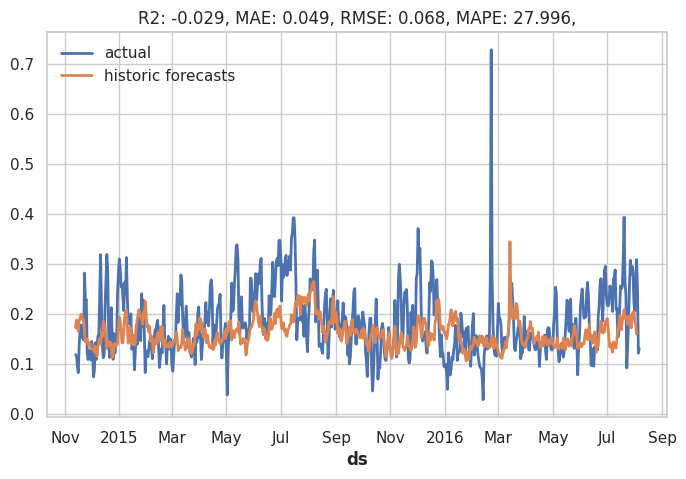

In [189]:
#base_forecast_ts_beats.plot(label='forecast')
#valid_ts.plot(label='actual')
display_forecast(best_valid_forecast_ts_tcn, valid_ts_scaled, start_date=None)

In [190]:
# Evaluate Test
best_eval_test_tcn = run_evaluate_model(
    best_model_tcn,
    valid_ts_scaled,
    test_ts_scaled,
    horizont = 7,
    stride = 7,
    transform = transform
)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:51:11 - INFO - transform forecast


In [191]:
# Get forecast and metrics
best_test_forecast_ts_tcn = best_eval_test_tcn["forecast"]
best_test_metrics_tcn = best_eval_test_tcn['metrics']
print(f"[TCN] Metrics Test: {best_test_metrics_tcn}")

[TCN] Metrics Test: {'mae': 0.04763382144923296, 'rmse': 0.0607551067039044, 'mape': 30.651108398061226}


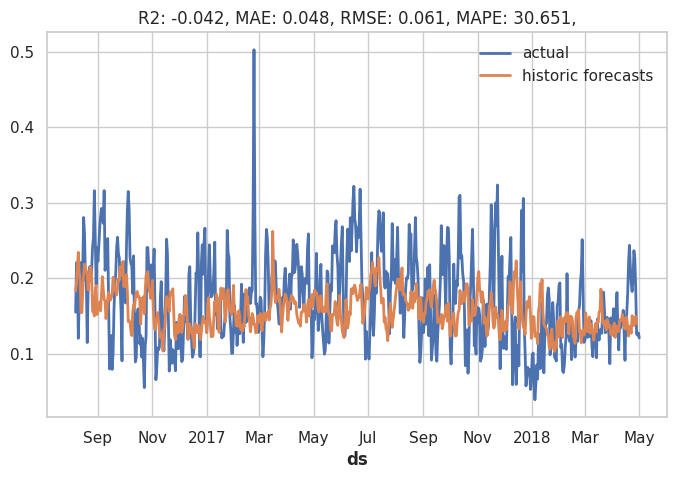

In [192]:
display_forecast(best_test_forecast_ts_tcn, test_ts_scaled, start_date=None)

In [193]:
!ls -lh "{TCN_MODELS_DIR}"

total 5.1M
-rw-rw-rw- 1 codespace codespace 444K Feb  3 18:50 baseline_model_tcn.pt
-rw------- 1 codespace codespace  23K Feb  3 18:50 baseline_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_test.json
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:50 baseline_model_tcn_eval_valid.json
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_test.csv
-rw-rw-rw- 1 codespace codespace  18K Feb  3 18:50 baseline_model_tcn_forecast_test_back.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid.csv
-rw-rw-rw- 1 codespace codespace  19K Feb  3 18:50 baseline_model_tcn_forecast_valid_back.csv
-rw-rw-rw- 1 codespace codespace 2.3M Feb  3 18:51 best_model_tcn.pt
-rw------- 1 codespace codespace 2.2M Feb  3 18:51 best_model_tcn.pt.ckpt
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:51 best_model_tcn_eval_test.json
-rw-rw-rw- 1 codespace codespace   84 Feb  3 18:51 best_model_tcn_eval_valid.js

## NBEAST

### Baseline model

In [194]:
def train_nbeats(
    train,
    valid,
    params:dict={},
    transform=None
):
    logger.info(f"[TRAIN-NBEATS] params: {params}")
    # reproducibility
    torch.manual_seed(42)

    # throughout training we'll monitor the validation loss for early stopping
    early_stopper = EarlyStopping(
        monitor="val_loss",
        min_delta=0.001,
        patience=5,
        verbose=True
    )
    if 'callbacks' in params:
      callbacks = [early_stopper] + params['callbacks']
      del params['callbacks']
    else:
      callbacks = [early_stopper]

    # detect if a GPU is available
    if torch.cuda.is_available():
        pl_trainer_kwargs = {
            "accelerator": "gpu",
            "gpus": -1,
            "auto_select_gpus": True,
            "callbacks": callbacks,
        }
        num_workers = 4
    else:
        pl_trainer_kwargs = {"callbacks": callbacks}
        num_workers = 0

    params['pl_trainer_kwargs'] = pl_trainer_kwargs

    # Check learning rate
    if 'learning_rate' in params:
      params['optimizer_kwargs'] = {'lr': params['learning_rate']}
      del params['learning_rate']

    # Create model
    model = NBEATSModel(**params)

    # Train
    model.fit(
        train,
        val_series=valid
    )

    # reload best model over course of training
    model = NBEATSModel.load_from_checkpoint(params['model_name'])

    # Predict
    eval_valid = run_evaluate_model(
        model,
        train,
        valid,
        horizont=7,
        stride=7,
        transform=transform
    )

    train_result = {'model': model}
    return {**train_result, **eval_valid}

In [195]:
#BASE_MODEL_NAME_NBEATS = 'base_model_nbeats'
RANDOM_SEED = 42
N_EPOCHS = 1
base_params_nbeats = {
    'input_chunk_length': 24,
    'output_chunk_length': 12,
    'n_epochs': N_EPOCHS,
    'random_state': RANDOM_SEED,
    'model_name': BASELINE_MODEL_NAME_NBEATS,
    'force_reset':True,
    'save_checkpoints':True,
}
base_params_nbeats

{'input_chunk_length': 24,
 'output_chunk_length': 12,
 'n_epochs': 1,
 'random_state': 42,
 'model_name': 'baseline_model_nbeats',
 'force_reset': True,
 'save_checkpoints': True}

In [196]:
%%time
# Train with NBEATS: Base model

'''
base_trained_nbeast = train_nbeats(
    train_ts_scaled,
    valid_ts_scaled,
    params=base_params_nbeats,
    transform=transform,
)
'''
run_traininig(
    train_ts_scaled,
    valid_ts_scaled,
    test_ts_scaled,
    trainer=train_nbeats,
    model_params=base_params_nbeats,
    model_name=BASELINE_MODEL_NAME_NBEATS,
    models_dir=NBEATS_MODELS_DIR,
    transform = transform
)

2025-02-03 18:51:12 - INFO - [TRAIN-NBEATS] params: {'input_chunk_length': 24, 'output_chunk_length': 12, 'n_epochs': 1, 'random_state': 42, 'model_name': 'baseline_model_nbeats', 'force_reset': True, 'save_checkpoints': True}
2025-02-03 18:51:12 - INFO - Train dataset contains 5029 samples.
2025-02-03 18:51:12 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
------------------------------------------------------

Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Metric val_loss improved. New best score: 0.005
`Trainer.fit` stopped: `max_epochs=1` reached.
2025-02-03 18:51:28 - INFO - loading best-epoch=0-val_loss=0.01.ckpt
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:51:29 - INFO - transform forecast
2025-02-03 18:51:29 - INFO - [RUN-TRAINING] Train Metrics: {'mae': 0.0480182760098566, 'rmse': 0.06321455416646948, 'mape': 30.867641354504524}
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:51:30 - INFO - transform forecast
2025-02-03 18:51:30 - INFO - [RUN-TRAINING] Test Metrics: {'mae': 0.045648939725106884, 'rmse': 0.057890343963451156, 'mape': 32.67317815850096}


CPU times: user 31.8 s, sys: 1.56 s, total: 33.4 s
Wall time: 18.1 s


In [197]:
!ls -lh "darts_logs/{BASELINE_MODEL_NAME_NBEATS}"
!ls -lh "{NBEATS_MODELS_DIR}"

total 180K
-rw-rw-rw-  1 codespace codespace 176K Feb  3 18:51 _model.pth.tar
drwxrwxrwx+ 2 codespace codespace 4.0K Feb  3 18:51 checkpoints
total 96M
-rw-rw-rw- 1 codespace codespace 48M Feb  3 18:51 baseline_model_nbeats.pt
-rw------- 1 codespace codespace 48M Feb  3 18:51 baseline_model_nbeats.pt.ckpt
-rw-rw-rw- 1 codespace codespace  86 Feb  3 18:51 baseline_model_nbeats_eval_test.json
-rw-rw-rw- 1 codespace codespace  84 Feb  3 18:51 baseline_model_nbeats_eval_valid.json
-rw-rw-rw- 1 codespace codespace 19K Feb  3 18:51 baseline_model_nbeats_forecast_test.csv
-rw-rw-rw- 1 codespace codespace 19K Feb  3 18:51 baseline_model_nbeats_forecast_test_back.csv
-rw-rw-rw- 1 codespace codespace 19K Feb  3 18:51 baseline_model_nbeats_forecast_valid.csv
-rw-rw-rw- 1 codespace codespace 19K Feb  3 18:51 baseline_model_nbeats_forecast_valid_back.csv


In [198]:
!cat "{NBEATS_MODELS_DIR}/{BASELINE_MODEL_NAME_NBEATS}_eval_valid.json"

{"mae": 0.0480182760098566, "rmse": 0.06321455416646948, "mape": 30.867641354504524}

In [199]:
# Retrieve results
'''
base_model_nbeats = base_trained_nbeast["model"]
base_valid_forecast_ts_nbeats = base_trained_nbeast["forecast"]
base_valid_metrics_nbeats = base_trained_nbeast['metrics']
'''
# Read model
print(f"[NBEATS] Model   : {BASELINE_MODEL_NBEATS_FILE}")
baseline_model_nbeats = NBEATSModel.load(BASELINE_MODEL_NBEATS_FILE)
# Read Metrics
print(f"[NBEATS] Metrics : {BASELINE_VALID_EVAL_NBEATS_FILE}")
baseline_valid_metrics_nbeats = read_model_parms(BASELINE_VALID_EVAL_NBEATS_FILE)
print(f"[NBEATS] MetricS : {baseline_valid_metrics_nbeats}")
# Read Forecast
print(f"[NBEATS] Forecast: {BASELINE_VALID_FORECAST_NBEATS_FILE}")
baseline_valid_forecast_ts_nbeats = TimeSeries.from_csv(BASELINE_VALID_FORECAST_NBEATS_FILE, time_col='ds')

[NBEATS] Model   : ../models/notebook_nbeats/baseline_model_nbeats.pt
[NBEATS] Metrics : ../models/notebook_nbeats/baseline_model_nbeats_eval_valid.json
[NBEATS] MetricS : {'mae': 0.0480182760098566, 'rmse': 0.06321455416646948, 'mape': 30.867641354504524}
[NBEATS] Forecast: ../models/notebook_nbeats/baseline_model_nbeats_forecast_valid.csv


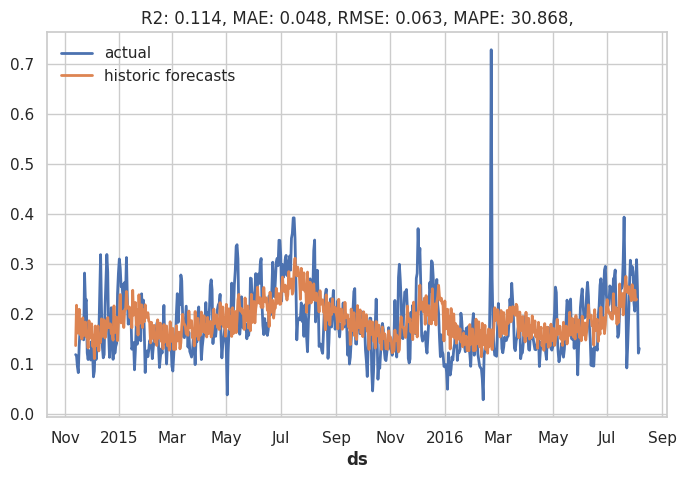

In [200]:
#base_forecast_ts_beats.plot(label='forecast')
#valid_ts.plot(label='actual')
display_forecast(baseline_valid_forecast_ts_nbeats, valid_ts_scaled, start_date=None)

In [201]:
%%time
# Predict Test
baseline_eval_test_nbeats = run_evaluate_model(
    baseline_model_nbeats,
    valid_ts_scaled,
    test_ts_scaled,
    horizont = 7,
    stride = 7,
    transform = transform
)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |                                                                                             | 0/…

2025-02-03 18:51:39 - INFO - transform forecast


CPU times: user 330 ms, sys: 16.3 ms, total: 346 ms
Wall time: 274 ms


In [202]:
baseline_test_forecast_ts_nbeats = baseline_eval_test_nbeats["forecast"]
baseline_test_metrics_nbeats = baseline_eval_test_nbeats['metrics']
print(f"[NBEATS] Metrics Test: {baseline_test_metrics_nbeats}")
#last_value = original_series.iloc[-1]
#reconstructed_series = last_value + differenced_forecast.cumsum()

[NBEATS] Metrics Test: {'mae': 0.045648939725106884, 'rmse': 0.057890343963451156, 'mape': 32.67317815850096}


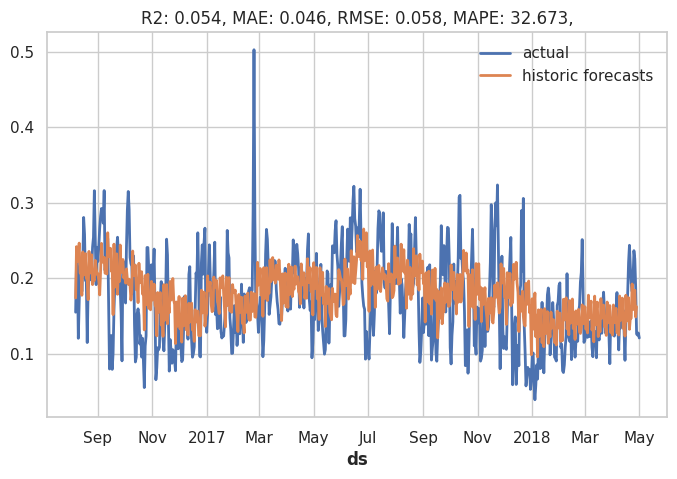

In [203]:
#base_pred_test_ts.plot(label='forecast')
#test_ts.plot(label='actual')
display_forecast(baseline_test_forecast_ts_nbeats, test_ts_scaled, start_date=None)

In [204]:
!ls -lh "{NBEATS_MODELS_DIR}"

total 96M
-rw-rw-rw- 1 codespace codespace 48M Feb  3 18:51 baseline_model_nbeats.pt
-rw------- 1 codespace codespace 48M Feb  3 18:51 baseline_model_nbeats.pt.ckpt
-rw-rw-rw- 1 codespace codespace  86 Feb  3 18:51 baseline_model_nbeats_eval_test.json
-rw-rw-rw- 1 codespace codespace  84 Feb  3 18:51 baseline_model_nbeats_eval_valid.json
-rw-rw-rw- 1 codespace codespace 19K Feb  3 18:51 baseline_model_nbeats_forecast_test.csv
-rw-rw-rw- 1 codespace codespace 19K Feb  3 18:51 baseline_model_nbeats_forecast_test_back.csv
-rw-rw-rw- 1 codespace codespace 19K Feb  3 18:51 baseline_model_nbeats_forecast_valid.csv
-rw-rw-rw- 1 codespace codespace 19K Feb  3 18:51 baseline_model_nbeats_forecast_valid_back.csv


### Hyperparameter Tuning


In [205]:
# Función para optimización usando Optuna
def optimize_nbeats_with_optuna(
    train_ts,
    valid_ts,
    transform,
    experiment_name='nbeats_optimization',
    n_trials=50,
    #n_epochs=100,
    #random_seed=42
    default_params:dict=None
):
    # Función objetivo para Optuna
    def objective(trial):
        input_chunk_length = trial.suggest_int('input_chunk_length', 20, 60)
        output_chunk_length = trial.suggest_int('output_chunk_length', 12, 30)
        num_stacks = trial.suggest_int('num_stacks', 1, 3)
        num_blocks = trial.suggest_int('num_blocks', 1, 5)
        num_layers = trial.suggest_int('num_layers', 2, 6)
        dropout = trial.suggest_uniform('dropout', 0.0, 0)
        learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-1)

        model_name = f"{experiment_name}_trial_{trial.number}"
        trial_params = {
            'input_chunk_length': input_chunk_length,
            'output_chunk_length': output_chunk_length,
            'num_blocks': num_blocks,
            'num_blocks': num_blocks,
            'num_layers': num_layers,
            'dropout': dropout,
            'learning_rate': learning_rate,
            #'optimizer_kwargs': {'lr': learning_rate},
            #'n_epochs': n_epochs,
            #'random_state': random_seed,
            # Model Name
            'model_name': model_name,
            'force_reset':True,
            'save_checkpoints':True,
        }
        if default_params:
          trial_params = {**default_params, **trial_params}
        print(trial_params)

        # Evaluación con historical_forecasts
        #model = train_nbeats_model(series_scaled, input_chunk_length, output_chunk_length, num_blocks, thetas_dim, hidden_layer_units, dropout, learning_rate)
        results = train_nbeats(
            train_ts,
            valid_ts,
            trial_params,
            transform
        )
        scores = results['metrics']
        error = scores['rmse']

        return error

    study = optuna.create_study(direction='minimize')
    study.optimize(lambda trial: objective(trial), n_trials=n_trials)

    return {
        'best_params': study.best_params,
        'results': study.trials
    }


In [206]:
# Setting
#BEST_MODEL_NAME_NBEATS = 'best_nbeats_model'
MAX_TRIALS = 2
MAX_N_EPOCHS = 5
RANDOM_SEED = 42

default_params_nbeats = {
    'n_epochs': MAX_N_EPOCHS,
    'random_state': RANDOM_SEED,
    'model_name': HPO_MODEL_NAME_NBEATS,
    'force_reset':True,
    'save_checkpoints':True,
}
NBEATS_MODELS_DIR, default_params_nbeats

('../models/notebook_nbeats',
 {'n_epochs': 5,
  'random_state': 42,
  'model_name': 'hpo_model_nbeats',
  'force_reset': True,
  'save_checkpoints': True})

In [ ]:
%%time
'''
optimize_results_nbeats = optimize_nbeats_with_optuna(
    train_ts_scaled,
    valid_ts_scaled,
    transform,
    n_trials=MAX_TRIALS,
    n_epochs=MAX_N_EPOCHS,
    random_seed=RANDOM_SEED
)
'''
# Optimize with TCN
run_optimization(
    train_ts_scaled,
    valid_ts_scaled,
    optimizer=optimize_nbeats_with_optuna,
    default_params=default_params_tcn,
    model_name=HPO_MODEL_NAME_NBEATS,
    models_dir=NBEATS_MODELS_DIR,
    transform=transform,
    n_trials=MAX_TRIALS,
    #n_epochs=MAX_N_EPOCHS,
    #random_seed=RANDOM_SEED
)

[I 2025-02-03 18:51:40,716] A new study created in memory with name: no-name-43690623-6713-49cf-9104-822aa282b4ce
2025-02-03 18:51:40 - INFO - [TRAIN-NBEATS] params: {'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_nbeats_trial_0', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 42, 'output_chunk_length': 21, 'num_blocks': 2, 'num_layers': 6, 'dropout': 0.0, 'learning_rate': 0.03201845890349295}
2025-02-03 18:51:40 - INFO - Train dataset contains 5002 samples.


{'n_epochs': 10, 'random_state': 42, 'model_name': 'hpo_model_nbeats_trial_0', 'force_reset': True, 'save_checkpoints': True, 'input_chunk_length': 42, 'output_chunk_length': 21, 'num_blocks': 2, 'num_layers': 6, 'dropout': 0.0, 'learning_rate': 0.03201845890349295}


2025-02-03 18:51:40 - INFO - Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 20.6 M | train
-------------------------------------------------------------
20.6 M    Trainable params
1.5 K     Non-trainable params
20.6 M    Total params
82.300    Total estimated model params size (MB)
846       Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                        | 0/…

Training: |                                                                                               | 0/…

Validation: |                                                                                             | 0/…

Metric val_loss improved. New best score: 410706861752250017358377002341197722926894557610016340710177783841716647400946288132763759596535086215623412926419287570500131815730342888956940407177438508705646192479253518658763122394448040652963840.000


Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

Validation: |                                                                                             | 0/…

In [ ]:
!ls -lh "{NBEATS_MODELS_DIR}"
!cat "{NBEATS_MODELS_DIR}/{HPO_MODEL_NAME_NBEATS}_params.json"

In [ ]:
# Read Optimized Paramters
print(HPO_PARAMS_NBEATS_FILE)
best_params_nbeats = build_model_params(
    optimized_params_path=HPO_PARAMS_NBEATS_FILE,
    default_params=default_params_nbeats
)
default_params_nbeats, best_params_nbeats

In [ ]:
%%time
# Train with TCN: Best model
'''
best_trained_nbeast = train_nbeats(
    train_ts_scaled,
    valid_ts_scaled,
    transform,
    params=best_params_nbeats
)
'''

run_traininig(
    train_ts_scaled,
    valid_ts_scaled,
    test_ts_scaled,
    trainer=train_nbeats,
    model_params=best_params_nbeats,
    model_name=BEST_MODEL_NAME_NBEATS,
    models_dir=NBEATS_MODELS_DIR,
    transform = transform
)

In [ ]:
# Retrieve results
'''
best_model_nbeats = best_trained_nbeast["model"]
best_valid_forecast_ts_nbeats = best_trained_nbeast["forecast"]
best_valid_metrics_nbeats = best_trained_nbeast['metrics']
'''
# Read Model
print(f"[NBEATS] Model   : {BEST_MODEL_NBEATS_FILE}")
best_model_nbeats = NBEATSModel.load(BEST_MODEL_NBEATS_FILE)
# Read Metrics
print(f"[NBEATS] Metrics : {BEST_VALID_EVAL_NBEATS_FILE}")
best_valid_metrics_nbeats = read_model_parms(BEST_VALID_EVAL_NBEATS_FILE)
print(f"[NBEATS] Metrics : {best_valid_metrics_nbeats}")
# Read Forecast
print(f"[NBEATS] Forecast: {BEST_VALID_FORECAST_NBEATS_FILE}")
best_valid_forecast_ts_nbeats = TimeSeries.from_csv(BEST_VALID_FORECAST_NBEATS_FILE, time_col='ds')

In [ ]:
#base_forecast_ts_beats.plot(label='forecast')
#valid_ts.plot(label='actual')
display_forecast(best_valid_forecast_ts_nbeats, valid_ts_scaled, start_date=None)

In [ ]:
%%time
# Predict Test
best_eval_test_nbeats = run_evaluate_model(
    best_model_nbeats,
    valid_ts_scaled,
    test_ts_scaled,
    horizont = 7,
    stride = 7,
    transform = transform
)

In [ ]:
# Get forecast and metrics
best_test_forecast_ts_nbeats = best_eval_test_nbeats["forecast"]
best_test_metrics_nbeats = best_eval_test_nbeats['metrics']
print(best_test_metrics_nbeats)

In [ ]:
display_forecast(best_test_forecast_ts_nbeats, test_ts_scaled, start_date=None)

In [ ]:
!ls -lh "{NBEATS_MODELS_DIR}"